# Assignment 2:

**Student:** Astride Melvin Fokam Ninyim

**Course:** XAI

### Import the requirements libraries and modules

In [49]:
import math
from typing import Callable, Literal

import pandas as pd, seaborn as sns, matplotlib.pyplot as plt, numpy as np

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPRegressor

import torch
from torch.utils.data import DataLoader, TensorDataset

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import numpy as np
import pandas as pd
from typing import Callable, Literal

import shap
import numpy as np
import pandas as pd
from typing import Callable, Literal

device = "cuda" if torch.cuda.is_available() else "cpu"

seed = 0
torch.manual_seed(seed)
np.random.seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False




from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

from itertools import chain, combinations, product

device = "cpu" #"cuda" if torch.cuda.is_available() else "cpu"

# **Homework 1**:

# A-Partial Dependence Plot (PDP)

### 1-Data preprocessing

In [50]:
with open("/content/LoanApprovalPrediction.csv", "r") as file:
    data_frame = pd.read_csv(file)
# Remove all rows with nan values
data_frame = data_frame.dropna()

In [51]:
print(len(data_frame.columns))

13


In [52]:
categorical_feature_names= ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Credit_History", "Dependents"]
continuous_feature_names= ["ApplicantIncome", "CoapplicantIncome", "LoanAmount", "Loan_Amount_Term"]
drop_column = "Loan_ID" # Not included as the value is unique for each row
label_column = "Loan_Status"

In [53]:
categories_per_feature = [
    sorted(data_frame[col].unique().tolist()) for col in categorical_feature_names]
ohencoder = OneHotEncoder(categories=categories_per_feature)
scaler = StandardScaler()
labelencoder = LabelEncoder()

In [54]:
def preprocess_data(df: pd.DataFrame, continuous_feature_names: list[str], categorical_feature_names: list[str], label_column=str) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Parameters:
        df (pd.DataFrame): the data in pandas dataframe format
        continuous_feature_names (list[str]): list of the feature names where the feature is continuous
        categorical_feature_names (list[str]): list of the feature names where the feature is categorical
        label_column (str): name of the label
    Returns:
        tuple[pd.DataFrame, pd.Dataframe]: preprocessed feature values and preprocessed labels
    """
    # Fit data, using a scaler for continuous data, oheencoder for categorical data and a labelencoder for the target values (label)
    continuous_features = scaler.transform(df[continuous_feature_names])
    categorical_features = ohencoder.transform(df[categorical_feature_names]).toarray()
    labels = labelencoder.transform(df[label_column])

    # Convert to tensors and using the available device
    continuous_features = torch.tensor(continuous_features, dtype=torch.float32, device=device)
    categorical_features = torch.tensor(categorical_features, dtype=torch.float32, device=device)
    labels = torch.tensor(labels, dtype=torch.float32, device=device)
    preprocessed_features = torch.hstack((continuous_features, categorical_features))

    return preprocessed_features, labels

In [55]:
df = data_frame.copy(deep=True) # we will use the raw data later and do not want to modify in place
scaler.fit(df[continuous_feature_names])
ohencoder.fit(df[categorical_feature_names])
labelencoder.fit(df[label_column])
preprocessed_data, labels = preprocess_data(df, continuous_feature_names, categorical_feature_names, label_column)

X_train, X_test, y_train, y_test = train_test_split(preprocessed_data, labels, random_state=42, test_size=0.2)
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32)

## 2-Create and train model

In [56]:
class Network(nn.Module):
    def __init__(self, input_dim: int):
        super().__init__()
        self.f1 = nn.Linear(input_dim, 64)
        self.f2 = nn.Linear(64, 1)

    def forward(self, x: torch.Tensor):
        x = F.relu(self.f1(x))
        x = self.f2(x)
        return x

In [57]:
def train_one_epoch(train_loader, model):
    model.train()
    for X, y in train_loader:
        optimizer.zero_grad()
        outputs = model(X).squeeze(-1)
        loss = loss_fn(outputs, y)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        outputs = model(X_test).squeeze(-1)
        loss = loss_fn(outputs, y_test)
        preds = torch.sigmoid(outputs)
        accuracy = sum((preds > 0.5) == y_test)/len(y_test)
    return loss, accuracy

In [58]:
input_dim = len(X_train[0])
model = Network(input_dim).to(device)
loss_fn = nn.BCEWithLogitsLoss()
optimizer = optim.SGD(model.parameters(), lr=0.03)

In [59]:
for _ in range(100):
    loss, accuracy = train_one_epoch(train_loader, model)
print("Loss:", loss.item(), "\nAccuracy:", accuracy.item())

Loss: 0.37547656893730164 
Accuracy: 0.8613861203193665


## Partial dependence plots

We want to marginalize over all other features $\boldsymbol{x}_C$ so the function show the relationship between features (or feature) in set $S$:
$$
\hat{f}_S(\boldsymbol{x}_S) = \frac{1}{n}\sum^n_{i=1} \hat{f}(\boldsymbol{x}_S, \boldsymbol{x}_C^{(i)})
$$

First let us consider one categorical feature

In [60]:
def create_modified_df(df: pd.DataFrame, feature: str, values: list) -> [dict[str, pd.DataFrame]]:
    """
    Parameters:
        df (pd.DataFrame): data
        feature (str): name of the feature that should be modified
        values (list): the possible values of the feature
    Returns:
        dict[str, pd.DataFrame]: set of dataframes where the the rows of the feature are set to the same value.
    """
    dfs = {}
    for value in values:
        df.loc[:, feature] = value
        dfs[value] = df.copy(deep=True)
    return dfs

In [61]:
feature_name = "Married"
categories = set(df[feature_name].values.flatten())
mod_dfs = create_modified_df(data_frame.copy(deep=True), feature_name, categories)

print("Original number of data points:", df.shape[0])
print(f"Possible values for the feature {feature_name}: {categories}")
print("Number of dataframes for upsampled data:", len(mod_dfs))
print("Total number of data points:", [sum(len(mod_dfs[_key]) for _key in mod_dfs.keys())][0])

Original number of data points: 505
Possible values for the feature Married: {'No', 'Yes'}
Number of dataframes for upsampled data: 2
Total number of data points: 1010


In [62]:
def get_marginalized_probability(df:pd.DataFrame, continuous_feature_names:list,
                                 categorical_feature_names:list, label_column:str)->float:
    """
    Parameters:
        df (pd.DataFrame): data
        continuous_feature_names (list): names of continuous feaures
        categorical_feature_names (list): names of categorical features
        label_column (str): header of the target column
    Returns:
        float: the mean sigmoid prediction for the dataframe.
    """
    preprocessed_data, labels = preprocess_data(df, continuous_feature_names, categorical_feature_names, label_column)

    outputs = model(preprocessed_data).squeeze(-1)
    preds = torch.sigmoid(outputs)
    return float(preds.mean().item())

In [63]:
probabilities= {}
for category in categories:
    df = mod_dfs[category].copy(deep=True)
    probability = get_marginalized_probability(df, continuous_feature_names, categorical_feature_names, label_column)
    probabilities[category] = probability

In [64]:
print(f"Marginalised probabilities per value of feature {feature_name}:")
print(probabilities)

Marginalised probabilities per value of feature Married:
{'No': 0.6497240662574768, 'Yes': 0.7166070938110352}


## Plot the results

In [65]:
y = probabilities.values()
x = probabilities.keys()

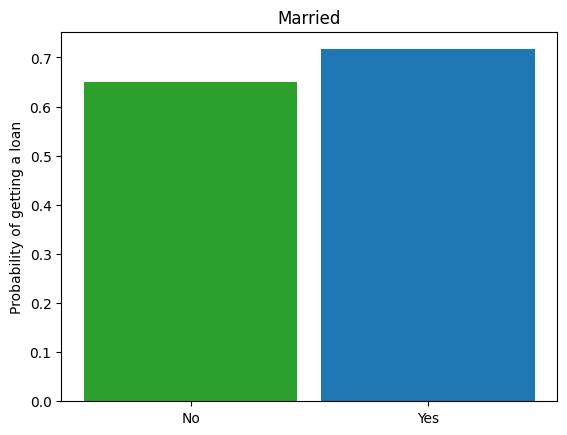

In [66]:
fig, ax = plt.subplots()
#ax.bar(x, y, width=0.9, linewidth=0.7, color=["tab:blue", "tab:green", "tab:orange"]) # property area
ax.bar(x, y, width=0.9, linewidth=0.7, color=["tab:green", "tab:blue"]) # married
plt.title(feature_name)
plt.ylabel("Probability of getting a loan")
plt.show()

## Categorical features

In [67]:
plot_data = []
for feature_name in categorical_feature_names:
    df = data_frame.copy(deep=True)
    categories = set(df[feature_name].values.flatten())
    mod_dfs = create_modified_df(df, feature_name, categories)

    probabilities = {}
    for category in categories:
        probability = get_marginalized_probability(mod_dfs[category], continuous_feature_names, categorical_feature_names, label_column)
        probabilities[category] = probability

    y = probabilities.values()
    x = probabilities.keys()
    plot_data.append((feature_name, x,y))

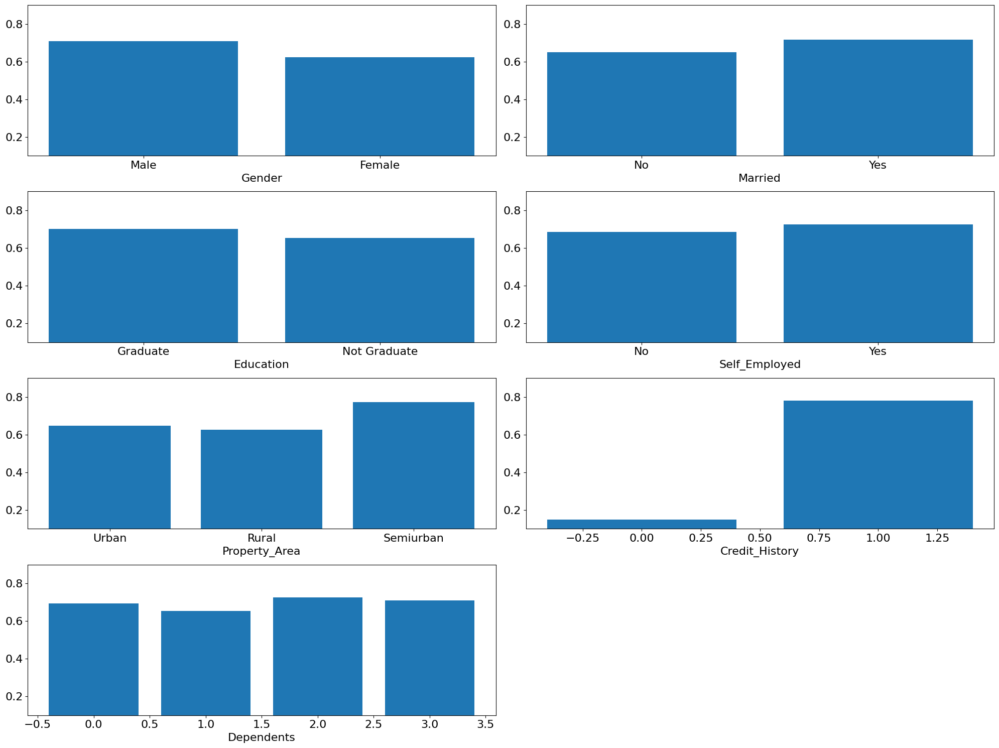

In [68]:
data = plot_data.copy()  # Just to be safe

ncols = 2
N = len(data)
nrows = math.ceil(N / ncols)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))

# Ensure axs is 2D
if nrows == 1 and ncols == 1:
    axs = [[axs]]
elif nrows == 1:
    axs = [axs]
elif ncols == 1:
    axs = [[ax] for ax in axs]

# Plot each feature as a bar chart
for i, (feature, x, y) in enumerate(data):
    r, c = divmod(i, ncols)
    ax = axs[r][c]
    ax.bar(x, y)
    ax.tick_params(axis='both', labelsize=16)
    ax.set_xlabel(feature, fontsize=16)
    ax.set_ylim(0.1, 0.9)  # Optional: adjust as needed


# Hide unused subplots
for j in range(N, nrows * ncols):
    r, c = divmod(j, ncols)
    axs[r][c].axis("off")

fig.tight_layout()
plt.show()


## Continuous features

In [69]:
#feature = "LoanAmount"
feature = "CoapplicantIncome"

In [70]:
plot_data = dict()
n = 10

for feature_name in continuous_feature_names:
    df = data_frame.copy(deep=True)
    # lower_bound = np.quantile(df[feature_name], 0.005)
    # upper_bound = np.quantile(df[feature_name], 0.995)
    # values = np.linspace(lower_bound, upper_bound, n, dtype=int)
    values = np.linspace(df[feature_name].min(), df[feature_name].max(), n, dtype=int)
    mod_dfs = create_modified_df(df, feature_name, values)

    probabilities = []
    for value in values:
        probability = get_marginalized_probability(mod_dfs[value].copy(deep=True),
                                                   continuous_feature_names, categorical_feature_names, label_column)
        probabilities.append(probability)

    plot_data[feature_name] = (values, probabilities)

In [71]:
print(f"Interval values for feature {feature}: {plot_data[feature][0]}")
print(f"Corresponding marginalized probabilities: {plot_data[feature][1]}")

Interval values for feature CoapplicantIncome: [    0  3759  7519 11279 15038 18798 22558 26317 30077 33837]
Corresponding marginalized probabilities: [0.6812028288841248, 0.7151671051979065, 0.6906607151031494, 0.6336539387702942, 0.5607153177261353, 0.47955846786499023, 0.3964312672615051, 0.31786590814590454, 0.24806664884090424, 0.1894361972808838]


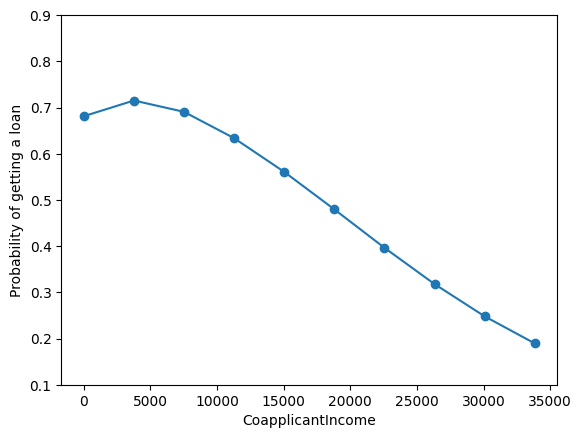

In [72]:
x, y = plot_data[feature]
plt.plot(x, y)
plt.scatter(x, y)
plt.ylim([0.1, 0.9])
plt.xlabel(feature)
plt.ylabel("Probability of getting a loan")
plt.show()

In [73]:
plot_data = dict()
n = 10

for feature_name in continuous_feature_names:
    df = data_frame.copy(deep=True)
    lower_bound = np.quantile(df[feature_name], 0.005)
    upper_bound = np.quantile(df[feature_name], 0.995)
    values = np.linspace(lower_bound, upper_bound, n, dtype=int)
    #values = np.linspace(df[feature_name].min(), df[feature_name].max(), n, dtype=int)
    mod_dfs = create_modified_df(df, feature_name, values)

    probabilities = []
    for value in values:
        probability = get_marginalized_probability(mod_dfs[value].copy(deep=True),
                                                   continuous_feature_names, categorical_feature_names, label_column)
        probabilities.append(probability)

    plot_data[feature_name] = (values, probabilities)

In [74]:
print(f"Interval values for feature {feature}: {plot_data[feature][0]}")
print(f"Corresponding marginalized probabilities: {plot_data[feature][1]}")

Interval values for feature CoapplicantIncome: [    0  1719  3439  5158  6878  8597 10317 12036 13756 15476]
Corresponding marginalized probabilities: [0.6812028288841248, 0.7036442160606384, 0.7146379947662354, 0.7116810083389282, 0.69781494140625, 0.676649272441864, 0.6501657962799072, 0.6198651790618896, 0.5867627263069153, 0.5515697598457336]


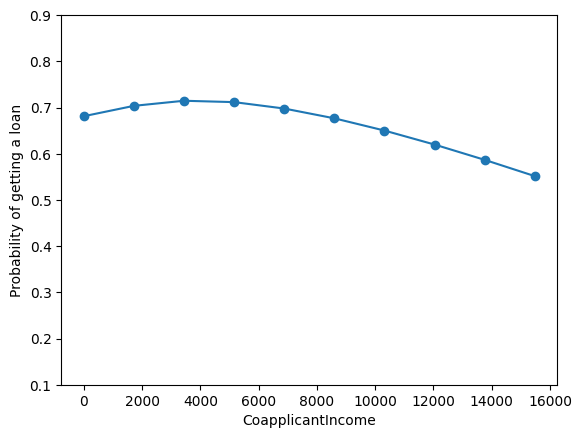

In [75]:
x, y = plot_data[feature]
plt.plot(x, y)
plt.scatter(x, y)
plt.ylim([0.1, 0.9])
plt.xlabel(feature)
plt.ylabel("Probability of getting a loan")
plt.show()

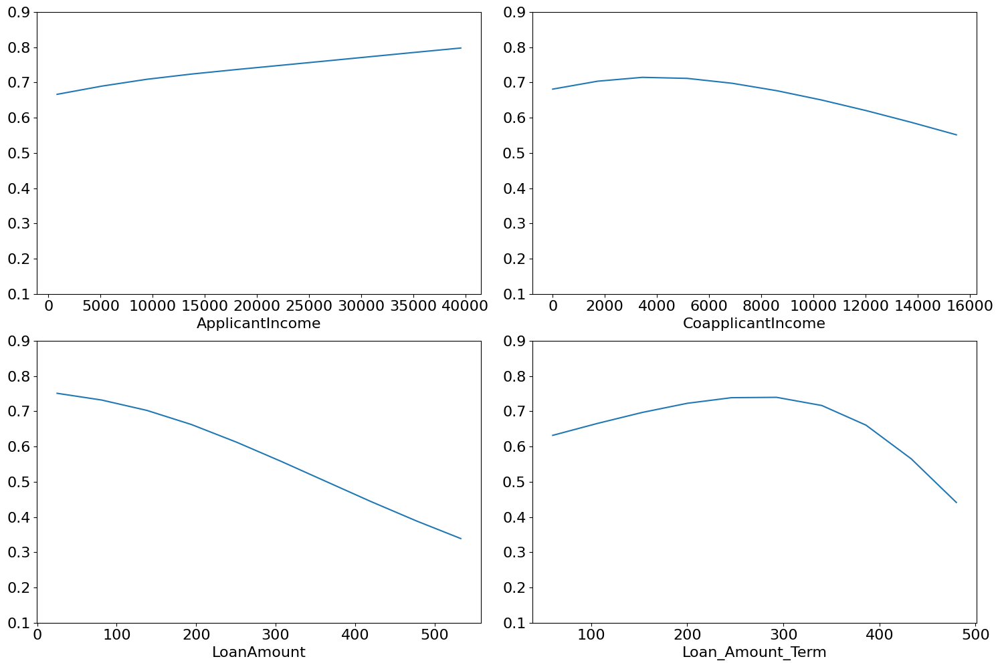

In [76]:
data = plot_data.copy()
ncols=2
figsize=(15,10)
sharex=False
sharey=False

keys = list(data.keys())
N = len(keys)
nrows = math.ceil(N / ncols)

fig, axs = plt.subplots(nrows, ncols, figsize=figsize, sharex=sharex, sharey=sharey)
# Ensure axs is 2D for consistent indexing
if nrows == 1 and ncols == 1:
    axs = [[axs]]
elif nrows == 1:
    axs = [axs]
elif ncols == 1:
    axs = [[ax] for ax in axs]

# Plot each series
for i, key in enumerate(keys):
    r, c = divmod(i, ncols)
    ax = axs[r][c]
    x, y = data[key]
    ax.plot(x, y)
    ax.set_xlabel(str(key), fontsize=16)
    ax.tick_params(axis='both', labelsize=16)
    #ax.grid(True, alpha=0.3)
    ax.set_ylim(0.1, 0.9)

# Turn off any unused axes
for j in range(N, nrows * ncols):
    r, c = divmod(j, ncols)
    axs[r][c].axis("off")

# Optional common labels
#fig.supylabel("Probability of getting a loan")
fig.tight_layout()

## 3D plot

In [77]:
def powerset(iterable, n: int = 2):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    comb = chain.from_iterable(combinations(s, r) for r in range(len(s)+1))
    return [list(x) for x in comb if len(x) == n]

In [78]:
def create_modified_dfs_2d(df: pd.DataFrame, feature1: str, feature2: str, grid_points: np.ndarray) -> list[pd.DataFrame]:
    """
    For each (val1, val2) in grid_points, return a DataFrame where:
    - feature1 is set to val1
    - feature2 is set to val2
    Returns:
        List of DataFrames (one for each point in the grid).
    """
    modified_dfs = dict()
    for val1, val2 in grid_points:
        df_mod = df.copy(deep=True)
        df_mod[feature1] = val1
        df_mod[feature2] = val2
        modified_dfs[val1, val2] = df_mod
    return modified_dfs

In [79]:
def get_marginalized_probability_2d(
    df: pd.DataFrame,
    feature1: str,
    value1,
    feature2: str,
    value2,
    values1: list,
    values2: list,
) -> float:
    """
    Calculates marginalized probability when both feature1=value1 and feature2=value2.
    """
    #? num_rows = df.shape[0]

    # Set both feature values across the entire dataset
    df = df.copy(deep=True)
    df[feature1] = value1
    df[feature2] = value2

    # Preprocess (custom function)
    preprocessed_data, labels = preprocess_data(
        df,
        continuous_feature_names=continuous_feature_names,
        categorical_feature_names=categorical_feature_names,
        label_column=label_column
    )

    # Model predictions
    outputs = model(preprocessed_data).squeeze(-1)
    preds = torch.sigmoid(outputs)

    return float(preds.mean().item())


In [80]:
plot_data = dict()
n = 10

feature_names = ["ApplicantIncome", "LoanAmount"]
for (feature_name_1, feature_name_2) in powerset(feature_names, n=2):
    df = data_frame.copy(deep=True)
    # First we drop rows for the feature values that is nan
    df = df.dropna(subset=[feature_name_1, feature_name_2])

    is_cat_1 = feature_name_1 in categorical_feature_names
    is_cat_2 = feature_name_2 in categorical_feature_names

    if is_cat_1:
        values_1 = list(set(df[feature_name_1].values.flatten()))
    else:
        lb1 = np.quantile(df[feature_name_1], 0.005)
        ub1 = np.quantile(df[feature_name_1], 0.995)
        values_1 = np.linspace(lb1, ub1, n, dtype=int)

    if is_cat_2:
        values_2 = list(set(df[feature_name_2].values.flatten()))
    else:
        lb2 = np.quantile(df[feature_name_2], 0.005)
        ub2 = np.quantile(df[feature_name_2], 0.995)
        values_2 = np.linspace(lb2, ub2, n, dtype=int)

    grid_1, grid_2 = np.meshgrid(values_1, values_2)
    grid_points = list(product(grid_1.ravel(), grid_2.ravel()))

    mod_dfs = create_modified_dfs_2d(df, feature_name_1, feature_name_2, grid_points)

    probabilities = []
    vals1 = []
    vals2 = []
    for (val1, val2), mod_df in mod_dfs.items():
        probability = get_marginalized_probability_2d(mod_df.copy(deep=True), feature_name_1, val1, feature_name_2, val2, values_1, values_2)
        vals1.append(val1)
        vals2.append(val2)
        probabilities.append(probability)

    n, m = grid_1.shape
    vals1_grid = np.array(vals1).reshape(n, m)
    vals2_grid = np.array(vals2).reshape(n, m)
    probs_grid = np.array(probabilities).reshape(n, m)

    plot_data[(feature_name_1, feature_name_2)] = (vals1_grid, vals2_grid, probs_grid)

In [81]:
def encode_categories(arr):
    """Returns encoded numeric array + label mapping"""
    unique_vals = sorted(set(arr.ravel()))
    label_map = {val: i for i, val in enumerate(unique_vals)}
    encoded = np.vectorize(label_map.get)(arr)
    return encoded, label_map

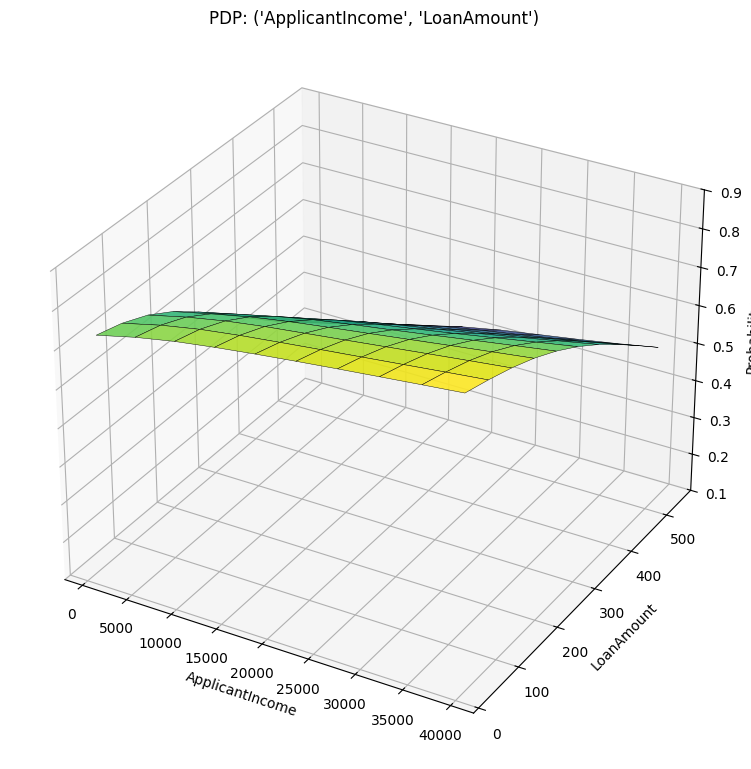

In [82]:
data = plot_data.copy()
ncols = 2
figsize = (15, 10)

keys = list(data.keys())
N = len(keys)
nrows = math.ceil(N / ncols)

fig = plt.figure(figsize=figsize)

# Create a grid of 3D subplots manually
for i, key in enumerate(keys):
    row, col = divmod(i, ncols)
    ax = fig.add_subplot(nrows, ncols, i + 1, projection='3d')

    X, Y, Z = data[key]  # Each is (n, m)
    if X.dtype.kind in {"U"}:
        X, x_labels = encode_categories(X)
        ax.set_xticks(list(x_labels.values()))
        ax.set_xticklabels(list(x_labels.keys()))
    if Y.dtype.kind in {"U"}:
        Y, y_labels = encode_categories(Y)
        ax.set_yticks(list(y_labels.values()))
        ax.set_yticklabels(list(y_labels.keys()))
    ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='k', linewidth=0.3, alpha=0.9)

    # Axis labels
    ax.set_xlabel(str(key[0]))
    ax.set_ylabel(str(key[1]))

    ax.set_zlabel("Probability")
    ax.set_title(f"PDP: {key}")
    ax.set_zlim(0.1, 0.9)

# Optional: adjust layout
fig.tight_layout()
plt.show()

# B-Accumulated Local Effects (ALE)

### 1-Data preprocessing

In [83]:
X, y = fetch_california_housing(as_frame=True, return_X_y=True)
train_df = pd.concat([X, y], axis=1).dropna() # Remove all rows with NaN values
X = train_df[X.columns]
y = train_df[y.name]
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=42)
df = X.assign(MedHouseVal=y)
feature_names = X_train.columns.tolist()

In [84]:
X, y = fetch_california_housing(as_frame=True, return_X_y=True)
train_df = pd.concat([X, y], axis=1).dropna() # Remove all rows with NaN values
X = train_df[X.columns]
y = train_df[y.name]
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=42)
df = X.assign(MedHouseVal=y)
feature_names = X_train.columns.tolist()

In [85]:
numerical_transformer = Pipeline([
])
preprocessor = ColumnTransformer(
    transformers = [
        ('scaler', StandardScaler(), feature_names)
    ],
    remainder = "drop"
)


pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', MLPRegressor()),
])

### 2-Train the model

In [86]:
pipe.fit(X_train, y_train)
print("Accuracy:", pipe.score(X_test, y_test))

Accuracy: 0.7817180345916585


### 1-Write the ALE function

# ALE estimation for a single feature
The explanations for the equations can be found in the [interpretable ml book](https://christophm.github.io/interpretable-ml-book/ale.html).

(1) First we estimate the uncentered effect:
$$
\hat{\tilde{f}}_{j,ALE}(\mathbf{x}) = \sum_{k=1}^{k_j(\mathbf{x})} \frac{1}{n_j(k)} \sum_{i: x_j^{(i)} \in N_j(k)} \left[\hat{f}(z_{k,j}, \mathbf{x}^{(i)}_{-j}) - \hat{f}(z_{k-1,j}, \mathbf{x}^{(i)}_{-j})\right]
$$
(2) Then we center the effect so that the mean effect is zero:
$$
\hat f_{j,\text{ALE}}(\mathbf{x}) = \hat{\tilde f}_{j,\text{ALE}}(\mathbf{x}) \;-\; \frac1n \sum_{i=1}^n \hat{\tilde f}_{j,\text{ALE}}\!\big(\mathbf{x}_j^{(i)}\big)
$$

# part 2

In [89]:
def ale(X: pd.DataFrame, model: Callable, feature: str, grid_size: int = 20, bin_method: Literal["quantile", "linear"] = "quantile"):
    """Compute the accumulated local effect of a numeric continuous feature.
    This function divides the feature in question into grid_size intervals (bins)
    and computes the difference in prediction between the first and last value
    of each interval and then centers the results.

    Arguments:
        X (pd.DataFrame): A pandas DataFrame to pass to the model for prediction.
        model: (Callable) Any python model with a predict method that accepts X as input.
        feature (str): String, the name of the column holding the feature being studied.
        grid_size (int): An integer indicating the number of intervals into which the feature range is divided.

    Return:
        A pandas DataFrame containing for each bin: the size of the sample in it
        and the accumulated centered effect of this bin.
    """
    if bin_method == "quantile":
        bins = np.quantile(
            X[feature],
            np.linspace(0, 1, grid_size + 1)
        )
    elif bin_method == "linear":
        min_val = X[feature].min()
        max_val = X[feature].max()
        bins = np.linspace(min_val, max_val, grid_size + 1)
    else:
        raise ValueError("bin_method must be 'quantile' or 'linear'")

    bins = np.unique(bins) # Ensure unique bin edges

    # Assign each value to a bin
    feat_cut = pd.cut(
        X[feature],
        bins=bins,
        include_lowest=True,
        right=True
    )

    bin_codes = feat_cut.cat.codes              # Index of interval for each data point
    bin_intervals = feat_cut.cat.categories     # The actual intervals (left, right]

    # Copy the dataframe twice
    X_left = X.copy()
    X_right = X.copy()

    # Replace the feature with left/right bin boundaries
    X_left[feature] = [
        bin_intervals[i].left if i >= 0 else X[feature].iloc[j]
        for j, i in enumerate(bin_codes)
    ]
    X_right[feature] = [
        bin_intervals[i].right if i >= 0 else X[feature].iloc[j]
        for j, i in enumerate(bin_codes)
    ]

    y_left = model.predict(X_left)
    y_right = model.predict(X_right)

    # Local Effects
    delta = [[] for _ in range(len(bin_intervals))]
    for i, k in enumerate(bin_codes):
        if k >= 0:
            delta[k].append(y_right[i] - y_left[i])

    delta_mean = np.array([
        np.mean(d) if len(d) > 0 else 0.0
        for d in delta
    ])

    delta_cumsum = np.concatenate(([0.0], np.cumsum(delta_mean)))

    # Center the ALE
    delta_centered = delta_cumsum - np.mean(delta_cumsum)

    return delta_centered, bin_intervals, delta_mean

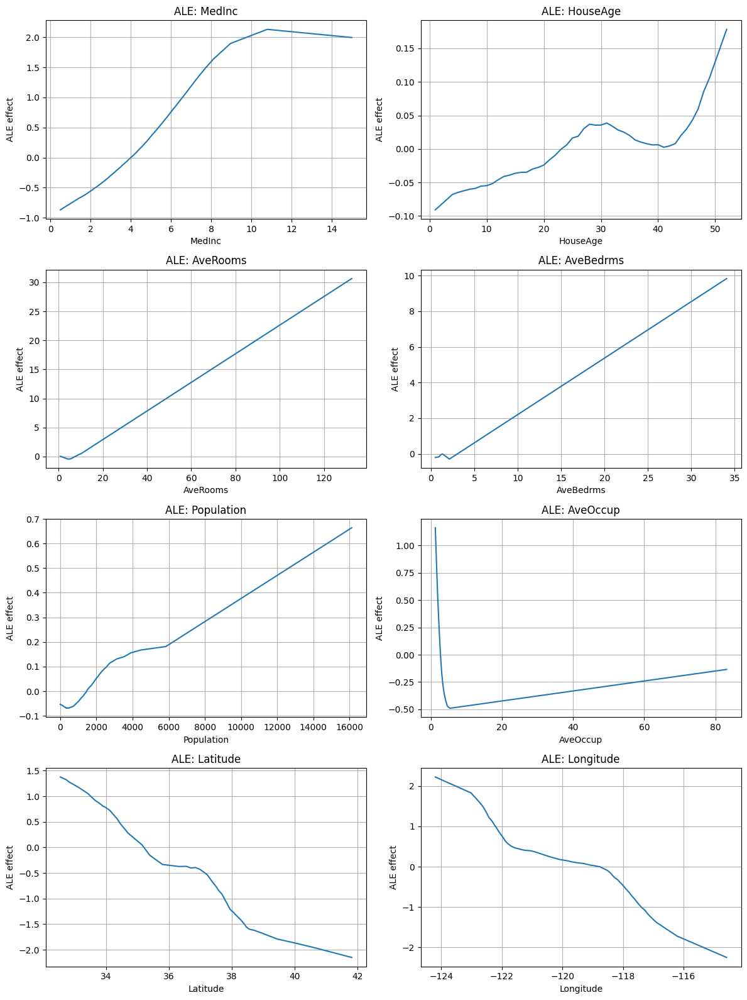

In [91]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

for idx, feature_name in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    # Compute ALE effect
    ale_eff, bin_intervals, _ = ale(
        X=X_test,
        model=pipe,
        feature=feature_name,
        grid_size=100,
    )

    intervals = list(bin_intervals.left) + [bin_intervals.right[-1]] # For x axis

    ax.plot(intervals, ale_eff)
    ax.set_title(f"ALE: {feature_name}")
    ax.set_xlabel(feature_name)
    ax.set_ylabel("ALE effect")
    ax.grid(True)

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.savefig("ale.png")
plt.show()

## Study effect of using quantiles vs linear bins

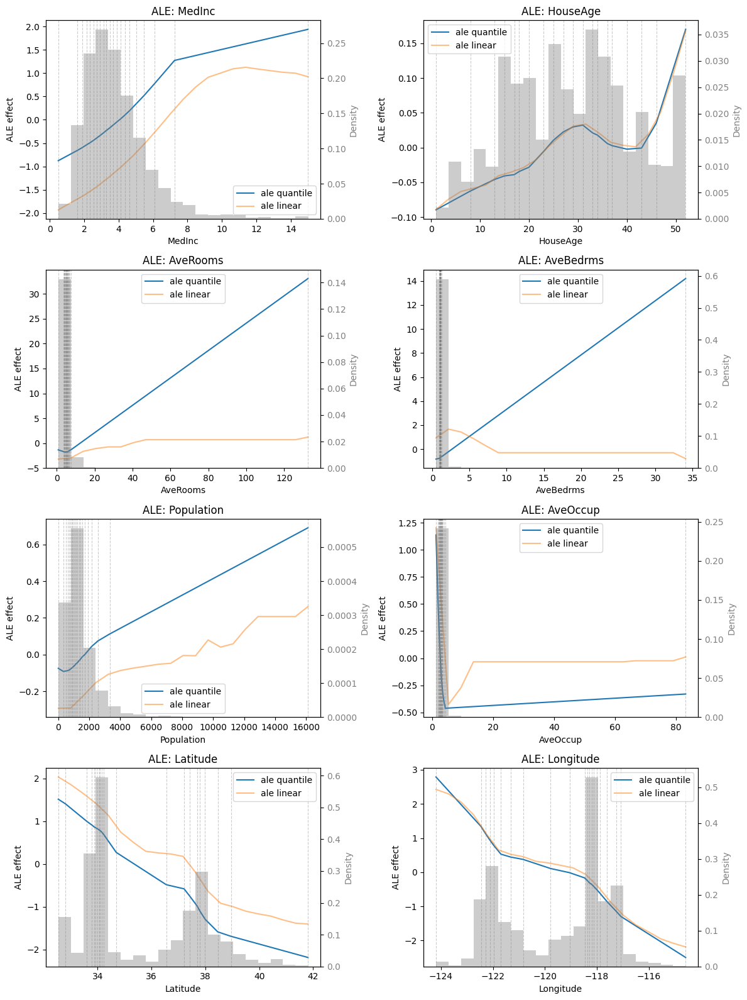

In [93]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

ale_effects = {}
ale_effects_linear = {}

ale_intervals = {}
ale_intervals_linear = {}

for idx, feature in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    # Compute ALE effect
    ale_eff, bin_intervals, delta_mean = ale(
        X=X_test,
        model=pipe,
        feature=feature,
        grid_size=20,
    )
    ale_eff_linear, bin_intervals_linear, delta_mean_linear = ale(
        X=X_test,
        model=pipe,
        feature=feature,
        grid_size=20,
        bin_method="linear",
    )

    intervals = list(bin_intervals.left) + [bin_intervals.right[-1]] # For x axis labels
    intervals_linear = list(bin_intervals_linear.left) + [bin_intervals_linear.right[-1]] # For x axis labels

    ale_effects[feature] = ale_eff
    ale_effects_linear[feature] = ale_eff_linear
    ale_intervals[feature] = intervals
    ale_intervals_linear[feature] = intervals_linear

    interval_widths = list(bin_intervals.right - bin_intervals.left)

    # Manually plot ALE curve on the given axis
    ax.plot(intervals, ale_eff, label="ale quantile")
    ax.plot(intervals_linear, ale_eff_linear, alpha=0.5, label="ale linear")

    # play with this one
    #for xline in intervals_linear:
    for xline in intervals:
        ax.axvline(x=xline, color="gray", linestyle="--", alpha=0.4, linewidth=0.8)

    ax.set_title(f"ALE: {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("ALE effect")
    ax.grid(False)
    ax.legend()

    ax_hist = ax.twinx()
    ax_hist.hist(
        X_test[feature],
        bins=20,
        color="gray",
        alpha=0.4,
        density=True,     # so it scales nicely with ALE curve
    )
    ax_hist.set_ylabel("Density", color="gray")
    ax_hist.tick_params(axis='y', labelcolor='gray')

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.savefig("ale.png")
plt.show()

# part 3

### With permutation Explainer

In [94]:
background = X_train.sample(1000)
explainer = shap.PermutationExplainer(pipe.predict, background)
shap_values = explainer.shap_values(X_test)

PermutationExplainer explainer: 4129it [02:37, 25.68it/s]                          


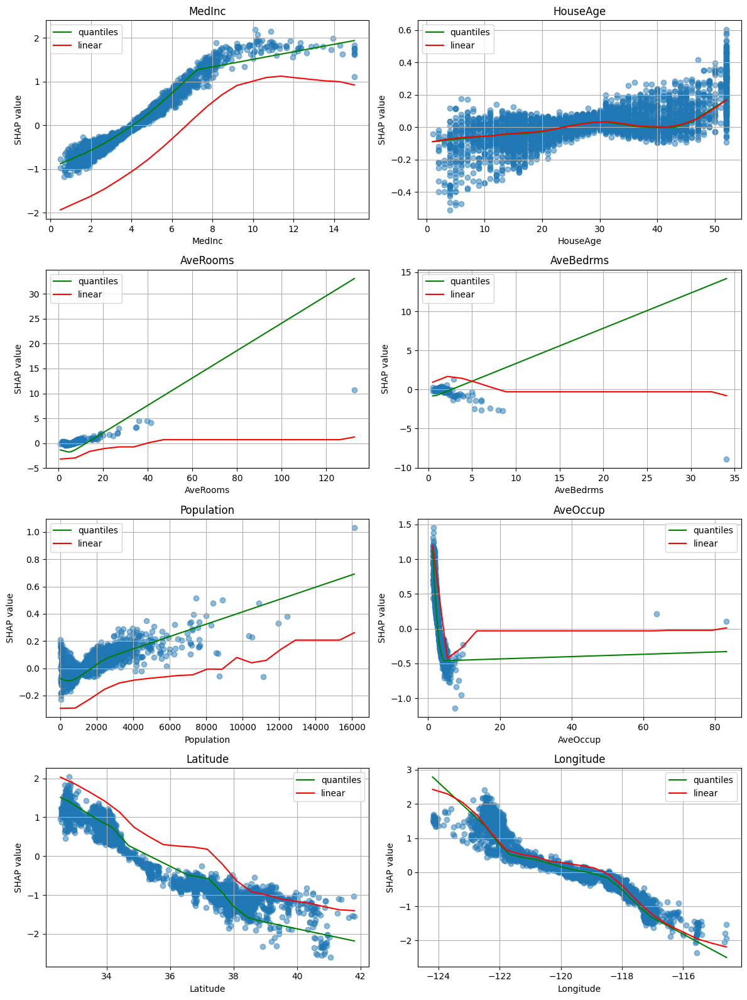

In [95]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

for idx, feature_name in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    feature_index = X_test.columns.get_loc(feature_name)
    shap_vals_feature = shap_values[:, feature_index]
    feature_values = X_test[feature_name].values

    ax.plot(ale_intervals[feature_name], ale_effects[feature_name], color="green", label="quantiles")
    ax.plot(ale_intervals_linear[feature_name], ale_effects_linear[feature_name], color="red", label="linear")
    ax.scatter(feature_values, shap_vals_feature, alpha=0.5)
    ax.set_xlabel(feature_name)
    ax.set_ylabel("SHAP value")
    ax.set_title(f"{feature_name}")
    ax.grid(True)
    ax.legend()

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.show()

### With Exact Explainer

In [96]:
background = X_train.sample(1000)
explainer = shap.explainers.Exact(pipe.predict, background)
shap_values = explainer(X_test)

ExactExplainer explainer: 4129it [02:41, 24.21it/s]                          


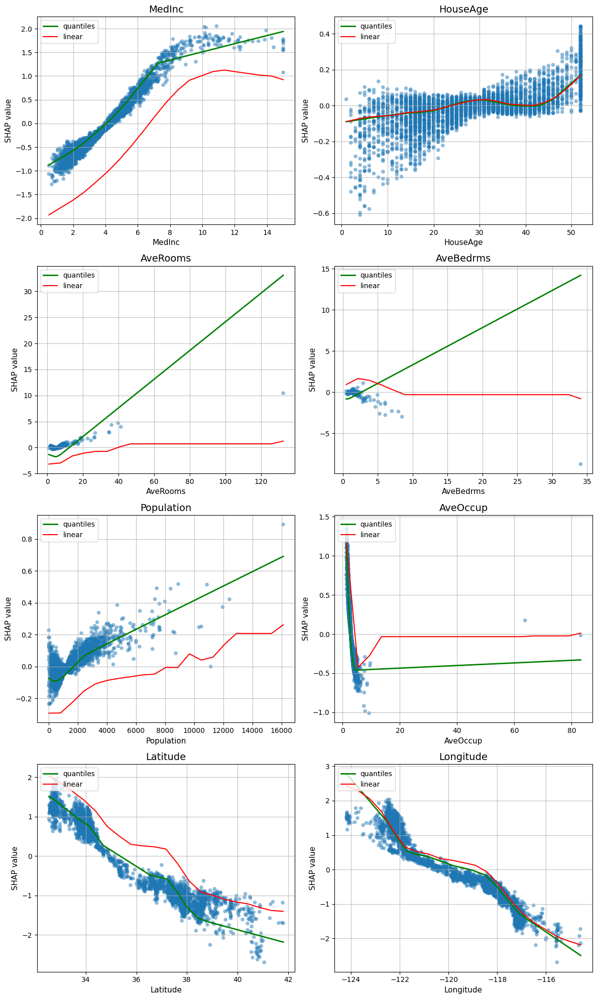

In [97]:
import matplotlib.pyplot as plt
import numpy as np

# Configuration globale pour correspondre au style de l'image
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # Ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows), squeeze=False)

for idx, feature_name in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    # --- 1. Extraction des données ---
    # Gestion de l'objet Explanation de SHAP ou d'un array numpy
    if hasattr(shap_values, "values"):
        # Syntaxe moderne
        sv = shap_values[:, feature_name].values
    else:
        # Ancienne syntaxe
        feature_index = X_test.columns.get_loc(feature_name)
        sv = shap_values[:, feature_index]

    fv = X_test[feature_name].values

    # --- 2. Scatter Plot (SHAP) ---
    # Points bleus semi-transparents
    ax.scatter(fv, sv, alpha=0.5, s=30, color='tab:blue', edgecolors='none')

    # --- 3. ALE Plots (Lignes) ---
    # Ligne verte pour l'approche par quantiles
    ax.plot(ale_intervals[feature_name], ale_effects[feature_name],
            color="green", label="quantiles", linewidth=2)

    # Ligne rouge pour l'approche linéaire (si elle existe dans tes données)
    if feature_name in ale_effects_linear:
        ax.plot(ale_intervals_linear[feature_name], ale_effects_linear[feature_name],
                color="red", label="linear", linewidth=1.5)

    # --- 4. Mise en forme (Labels et Grille) ---
    ax.set_title(feature_name, fontsize=14)
    ax.set_xlabel(feature_name, fontsize=11)
    ax.set_ylabel("SHAP value", fontsize=11)

    # Grille visible comme sur l'image
    ax.grid(True, which='both', linestyle='-', alpha=0.8)

    # Légende en haut à gauche
    ax.legend(loc="upper left", frameon=True)

# Désactiver les sous-graphiques vides si nécessaire
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.show()

# Homework 2:

In [ ]:
!git clone https://github.com/strumke/AIMS_XAI_Inga.git

fatal: destination path 'AIMS_XAI_Inga' already exists and is not an empty directory.


In [ ]:
import sys
sys.path.append("/content/AIMS_XAI_Inga/CAV")

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision.io import read_image
from torchvision import models, transforms
from torchvision.models import ResNet18_Weights
from sklearn.utils import shuffle
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from PIL import Image

from image_processing import select_concept_images, sample_images, get_resnet_dataloader
from utils import flatten, get_activations, get_grads

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cpu


In [ ]:
batch_size = 16
num_concept_images = 100
num_target_images = 20
target_class = "zebra"
positive_concept = "striped" #"bubbly"
negative_concept = "dotted"

Download the broden and imagenet data from: TODO

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/imagenet.zip -d /content/data

Archive:  /content/drive/MyDrive/imagenet.zip
   creating: /content/data/imagenet/
  inflating: /content/data/imagenet/n02391049_2.jpg  
  inflating: /content/data/imagenet/n02391049_254.JPEG  
  inflating: /content/data/imagenet/volcano_zebra.jpg  
   creating: /content/data/imagenet/zebra/
  inflating: /content/data/imagenet/zebra/n02391049_10007.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10027.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_1004.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10047.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10063.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_101.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_1012.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10122.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10123.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10129.jpg  
  inflating: /content/data/imagenet/zebra/n02391049_10131.jpg  
  infla

In [ ]:
!cp -r /content/data/broden/* /content/AIMS_XAI_Inga/data/broden/
!cp -r /content/data/imagenet/* /content/AIMS_XAI_Inga/data/imagenet/

In [ ]:
!cp -r /content/data/broden/dtd /content/AIMS_XAI_Inga/data/broden/

In [ ]:
# Get the absolute path to concept and target images
base_dir ="/content/AIMS_XAI_Inga"# os.path.join(os.getcwd(), '../')
concept_folder = os.path.join(base_dir, 'data', 'broden', 'dtd')
target_folder = os.path.join(base_dir, 'data', 'imagenet', target_class)

p_concept_paths = select_concept_images(folder_path=concept_folder, concept=positive_concept, n=num_concept_images)
n_concept_paths = select_concept_images(folder_path=concept_folder, concept=negative_concept, n=num_concept_images)

target_paths = sample_images(folder_path=target_folder, n=num_target_images)

In [ ]:
resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1).to(device)
resnet.eval();

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 111MB/s]


In [ ]:
class_idx = ResNet18_Weights.IMAGENET1K_V1.meta["categories"].index(target_class)

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 224)),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

positive_loader = get_resnet_dataloader(p_concept_paths, transform, batch_size=batch_size)
negative_loader = get_resnet_dataloader(n_concept_paths, transform, batch_size=batch_size)
target_loader = get_resnet_dataloader(target_paths, transform, batch_size=batch_size)

## Interlude: Look at data and layer

In [ ]:
def look_at(image):
    img = (image - image.min()) / (image.max() - image.min())
    plt.imshow(img.permute(1, 2, 0))
    plt.show()

torch.Size([3, 224, 224])


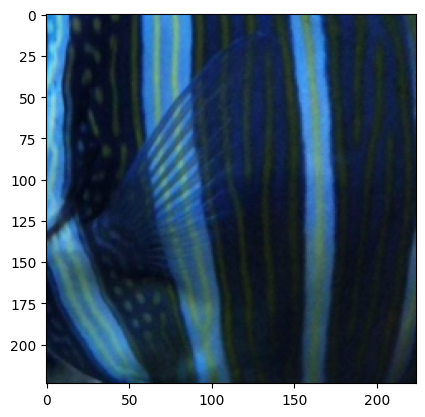

In [ ]:
pos_image = next(iter(positive_loader))[7]
print(pos_image.shape)
look_at(pos_image)

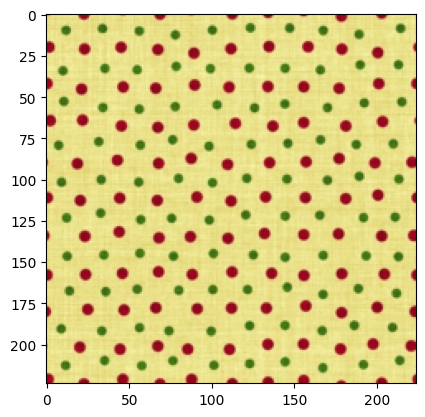

In [ ]:
neg_image = next(iter(negative_loader))[7]
look_at(neg_image)

In [ ]:
layer = resnet.layer4[0]
layer._modules

{'conv1': Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
 'bn1': BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 'relu': ReLU(inplace=True),
 'conv2': Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
 'bn2': BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 'downsample': Sequential(
   (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
   (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 )}

## Get activations manually

In [ ]:
activations = {}
# keys = layer names (strings)
# values = activation tensors

def get_activation(name):
    # function factory for creating a hook function that captures the name of the layer it’s attached to.
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

layer_name = 'layer4'
handle = dict(resnet.named_modules())[layer_name].register_forward_hook(get_activation(layer_name))


_ = resnet(pos_image.unsqueeze(0).to(device))

handle.remove()

print(activations["layer4"].shape)

torch.Size([1, 512, 7, 7])


In [ ]:
acts = activations["layer4"]
acts.view(acts.size(0), -1).numpy().shape

(1, 25088)

## Make the CAV

In [ ]:
def train_cav(positive_activations, negative_activations, seed=1337):

    X = np.concatenate([positive_activations, negative_activations], axis=0)
    y = np.concatenate([np.ones(len(positive_activations)), np.zeros(len(negative_activations))])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=seed)
    #X_train, y_train = shuffle(X, y, random_state=seed)
    classifier = LogisticRegression(random_state=seed, max_iter=1000)
    classifier.fit(X_train, y_train)

    accuracy = classifier.score(X_test, y_test)
    print("Probe accuracy:", accuracy)

    cav = classifier.coef_[0]
    unit_cav = cav / np.linalg.norm(cav)

    return unit_cav

In [ ]:
layer = resnet.layer4[0]

In [ ]:
positive_activations = flatten(get_activations(resnet, positive_loader, device, layer))
negative_activations = flatten(get_activations(resnet, negative_loader, device, layer))

In [ ]:
stripes_cav = train_cav(positive_activations, negative_activations)
#bubbly_cav = train_cav(positive_activations, negative_activations)

Probe accuracy: 1.0


In [ ]:
print(stripes_cav.shape)
print(stripes_cav)

(25088,)
[-0.00197389 -0.01441728 -0.01102986 ...  0.00241429  0.00346734
  0.00928773]


## ... and calculate TCAV scores

In imagenet, zebra is class 340

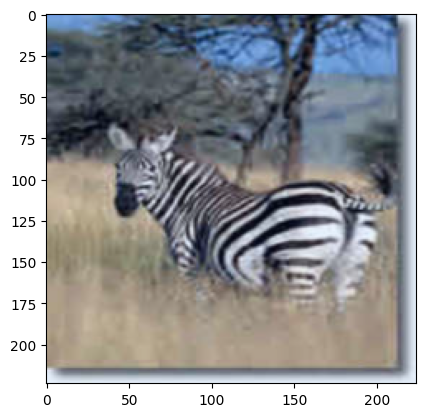

In [ ]:
image = next(iter(target_loader))[5]
look_at(image)

In [ ]:
def make_gradient_hook(grads):
    def bwd_hook(module, grad_input, grad_output):
        grad = grad_output[0]
        grads.append(grad.squeeze(0).detach().cpu())
    return bwd_hook

resnet.eval()
sample_input = image.unsqueeze(0).to(device)

grads = []
hook = layer.register_full_backward_hook(make_gradient_hook(grads))

resnet.zero_grad()
output = resnet(sample_input)
logits = output[0]

logit = logits[340]
logit.backward()
hook.remove()

print("Number of gradients from layer:", len(grads[0]))

Number of gradients from layer: 512


In [ ]:
def tcav(cav, grads):

    directional_derivatives = np.dot(grads, cav)
    positive_counts = np.sum(directional_derivatives > 0)
    tcav_score = positive_counts / directional_derivatives.shape[0]

    return tcav_score

In [ ]:
grads = flatten(get_grads(resnet, target_loader, device, layer, target_idx=340))
tcav_score = tcav(stripes_cav, grads)
#tcav_score = tcav(bubbly_cav, grads)
print(f"TCAV score: {tcav_score}")

TCAV score: 1.0


Task: Plot the probe accuracy per layer of the model.

First, modify the train_cav function to return probe accuracy.

In [ ]:
def train_cav(positive_activations, negative_activations, seed=1337):

    X = np.concatenate([positive_activations, negative_activations], axis=0)
    y = np.concatenate([np.ones(len(positive_activations)), np.zeros(len(negative_activations))])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=seed)
    #X_train, y_train = shuffle(X, y, random_state=seed)
    classifier = LogisticRegression(random_state=seed, max_iter=1000)
    classifier.fit(X_train, y_train)

    accuracy = classifier.score(X_test, y_test)

    cav = classifier.coef_[0]
    unit_cav = cav / np.linalg.norm(cav)

    return unit_cav, accuracy

Loop through model to get a list of all layers

In [ ]:
names, layers = [], []
for name, layer in resnet.named_children():
    names.append(name)
    layers.append(layer)
print("Number of layers:" , len(layers))

Number of layers: 10


In [ ]:
names

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc']

Get probe accuracies for each layer and plot

In [ ]:
accuracies = []
for _layer in layers:
    _positive_activations = flatten(get_activations(resnet, positive_loader, device, _layer))
    _negative_activations = flatten(get_activations(resnet, negative_loader, device, _layer))
    _, _accuracy = train_cav(_positive_activations, _negative_activations)
    accuracies.append(_accuracy)

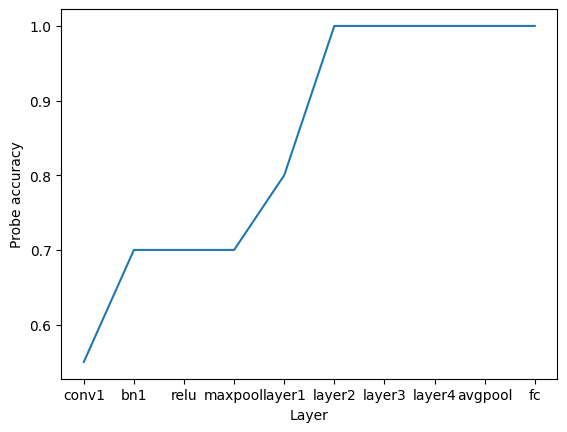

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(names)), names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

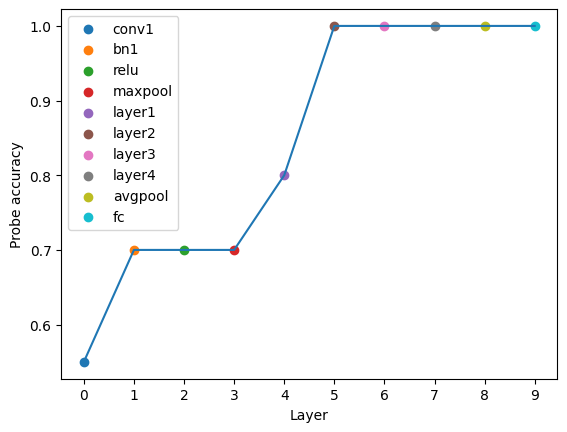

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
for _i, _acc in enumerate(accuracies):
    plt.scatter(_i, _acc, color=colors[_i], label=names[_i])
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(names)), range(len(names)))
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.legend()
plt.show()

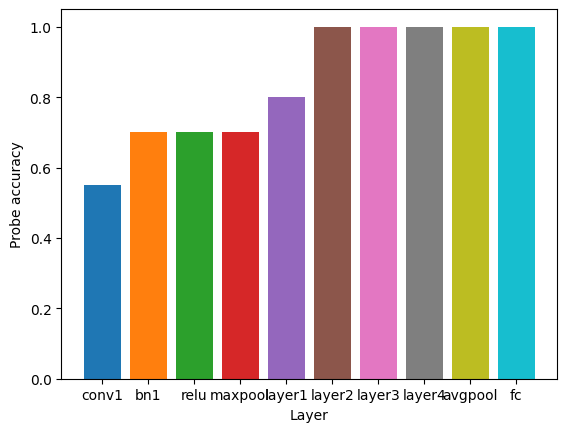

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.bar(range(len(accuracies)), accuracies, color=colors)
plt.xticks(range(len(names)), names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

We can also select the layers more carefully

In [ ]:
probe_layers = [resnet.conv1, resnet.layer1[0], resnet.layer2[0], resnet.layer3[0], resnet.layer4[0], resnet.fc]
probe_names = [names[0], names[4], names[5], names[6], names[7], names[9]]

In [ ]:
accuracies = []
for _layer in probe_layers:
    _positive_activations = flatten(get_activations(resnet, positive_loader, device, _layer))
    _negative_activations = flatten(get_activations(resnet, negative_loader, device, _layer))
    _, _accuracy = train_cav(_positive_activations, _negative_activations)
    accuracies.append(_accuracy)

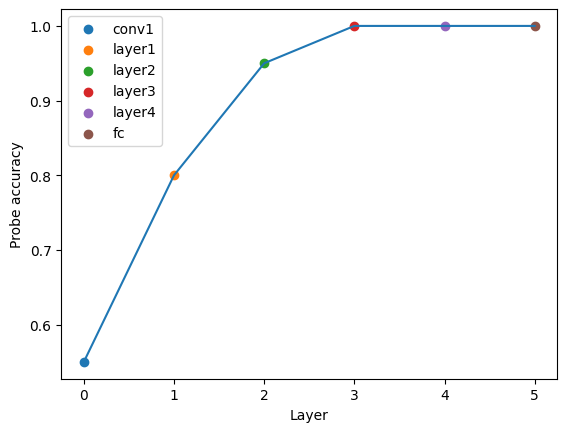

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
for _i, _acc in enumerate(accuracies):
    plt.scatter(_i, _acc, color=colors[_i], label=probe_names[_i])
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(probe_names)), range(len(probe_names)))
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.legend()
plt.show()

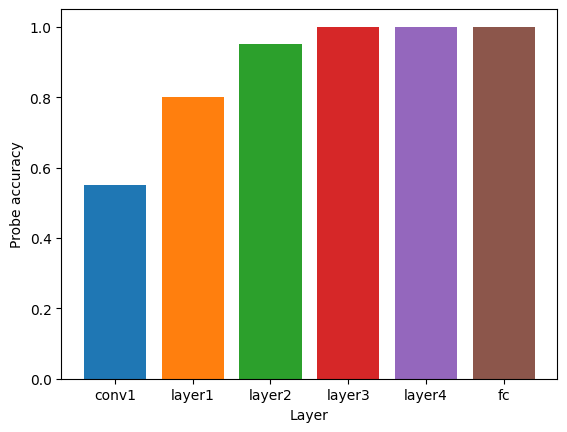

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.bar(range(len(accuracies)), accuracies, color=colors)
plt.xticks(range(len(probe_names)), probe_names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

Compare the stripes CAV to the activations in the corresponding layer, for the difficult image

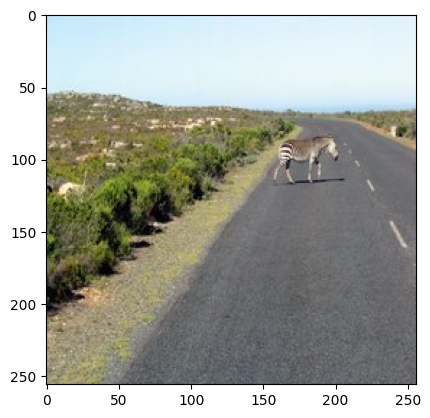

In [ ]:
filepath="/content/AIMS_XAI_Inga/data/imagenet/volcano_zebra.jpg"
img = Image.open(filepath).convert('RGB')
plt.imshow(img)
img_tensor = transform(img)

In [ ]:
resnet.eval();
resnet(img_tensor.unsqueeze(0).to(device)).argmax()

tensor(980)

In [ ]:
activations = {}

def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

layer_name = 'layer4'
handle = dict(resnet.named_modules())[layer_name].register_forward_hook(get_activation(layer_name))

_ = resnet(img_tensor.unsqueeze(0).to(device))

handle.remove()
mystery_activations = activations["layer4"].flatten()

In [ ]:
print("Activation vector shape:", mystery_activations.shape)
print("Stripes CAV shape:", stripes_cav.shape)

Activation vector shape: torch.Size([25088])
Stripes CAV shape: (25088,)


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

A cosine similarity score of 1 means that two vectors are identical, 0 means they are orthogonal (unrelated), and -1 means they are diametrically opposed.

In [ ]:
cosine_similarity(mystery_activations.reshape(1, -1), stripes_cav.reshape(1, -1))

array([[0.0372705]])

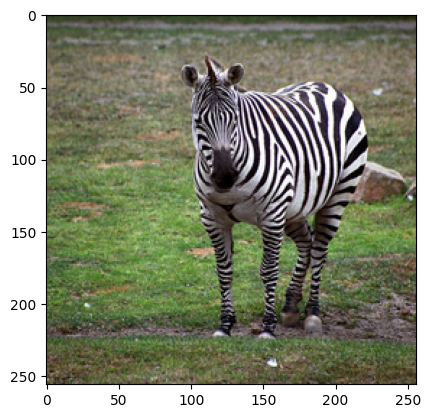

In [ ]:
filepath = "/content/AIMS_XAI_Inga/data/imagenet/n02391049_254.JPEG"
img = read_image(filepath).float() / 255.0
look_at(img)

In [ ]:
resnet.eval();
resnet(img.unsqueeze(0).to(device)).argmax()

tensor(340)

# Homework 3:

In [99]:
!pip install sage-importance

In [100]:
import sage

from itertools import combinations
import numpy as np
import pandas as pd
import xgboost
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

## 1-Data and model

In [101]:
df = sage.datasets.bike()
features = df.columns.tolist()[:-3]
target = df.columns.tolist()[-1]

In [102]:
print("Features:", features)
print("Target:", target)

Features: ['Year', 'Month', 'Day', 'Hour', 'Season', 'Holiday', 'Workingday', 'Weather', 'Temp', 'Atemp', 'Humidity', 'Windspeed']
Target: Count


In [103]:
# Split data, with total count serving as regression target
train, test = train_test_split(df, test_size=int(0.1 * len(df.values)), random_state=123)
train, val = train_test_split(train, test_size=int(0.1 * len(df.values)), random_state=123)

y_train = train[[target]]
y_val = val[[target]]
y_test = test[[target]]
x_train = train[features]
x_val = val[features]
x_test = test[features]

In [104]:
model = xgboost.XGBRegressor()
model.fit(x_train, y_train);

In [105]:
def mse(prediction, target):
    return np.mean((prediction - target)**2).item()

In [106]:
# Calculate performance
base_mse = np.mean((np.mean(y_train) - y_test) ** 2)
full_mse = mse(model.predict(x_test), y_test.to_numpy().flatten())

print("Base rate MSE = {:.2f}".format(base_mse))
print("Model MSE = {:.2f}".format(full_mse))

Base rate MSE = 31591.23
Model MSE = 1878.77


## LOFO

Homework: Write the lofo function

In [107]:
def lofo(model, features, train_df, y_train, test_df, y_test, loss):
    losses = {}
    lofos_ratio = {}
    lofos_diff = {}

    for feat in features:# subset of features, removing one feature each time
        _features = list(features)
        _features.remove(feat)
        _x_train = train_df[_features]#
        _x_test = test_df[_features]#

        _model = xgboost.XGBRegressor()
        _model.fit(_x_train, y_train) #

        #get the loss for the subset and store it
        _loss = loss(_model.predict(_x_test), y_test.to_numpy().flatten())
        losses[feat] = _loss



    for feat in features:# each feature in features,
        # calculate the lofo as a ratio or difference (or both)
        lofo = losses[feat]
        lofos_ratio[feat] = lofo/full_mse
        lofos_diff[feat] = lofo - full_mse

    return lofos_ratio, lofos_diff# the lofo(s)


In [108]:
def lofo(model, features, train_df, y_train, test_df, y_test, loss):
    losses = {}
    lofos_ratio = {}
    lofos_diff = {}

    for _features in combinations(features, len(features)-1):
        _excluded = list(set(features) - set(_features))[0]
        _features = list(_features)
        _x_train = train_df[_features]
        _x_test = test_df[_features]

        _model = xgboost.XGBRegressor()
        _model.fit(_x_train, y_train)

        _loss = loss(_model.predict(_x_test), y_test.to_numpy().flatten())

        losses[_excluded] = _loss

    for _feature in features:
        lofos_ratio[_feature] = losses[_feature]/full_mse
        lofos_diff[_feature] = losses[_feature]-full_mse

    return lofos_ratio, lofos_diff

In [109]:
lofos_ratio, lofos_diff = lofo(model, features, train, y_train, test, y_test, mse)

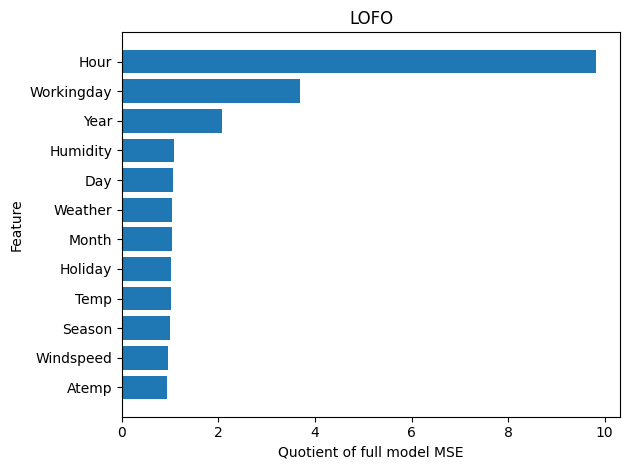

In [110]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_ratio.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Quotient of full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

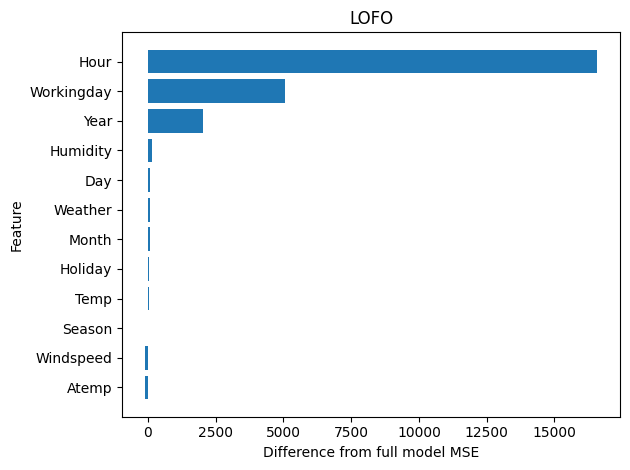

In [111]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_diff.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Difference from full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

## studying correlation structure of the dataset

In [112]:
import seaborn as sns

<Axes: >

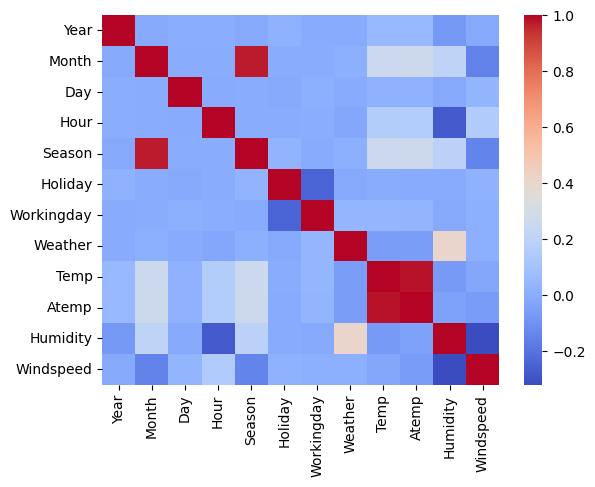

In [113]:
sns.heatmap(train[features].corr(), cmap='coolwarm')

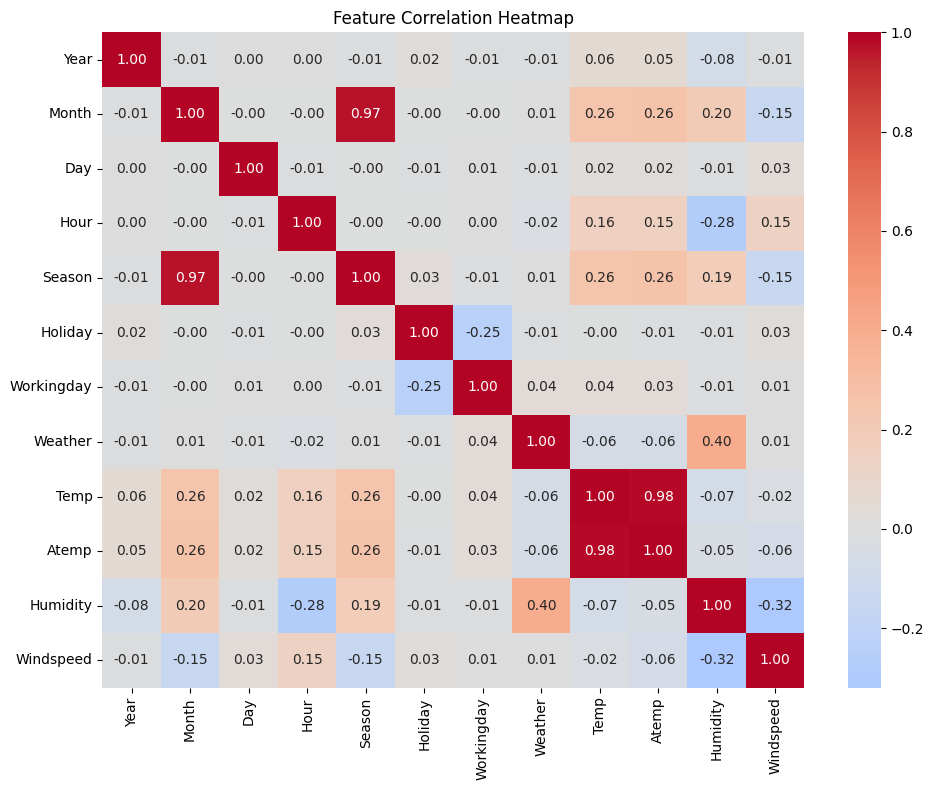

In [114]:
# Compute correlation matrix
corr = train[features].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, fmt=".2f")

plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()


### 1. Strong Positive Correlations

*   **Temp and Atemp:**
    *   **Why:** This is the strongest correlation in the dataset. `Temp` represents the actual measured air temperature, while `Atemp` is the apparent temperature (how it actually feels to a human). Because the actual temperature is the primary factor in calculating how hot it feels, these two variables will almost always move in perfect synchronization.
*   **Month and Season:**
    *   **Why:** This correlation is very high (the dark red square) because seasons are defined by specific months. For example, in many regions, June, July, and August are strictly defined as Summer. Since the season is a direct function of what month it is, they have a strong linear relationship.



We see that the feature "Month" correlates strongly with Season and Temperature.

Let's find a point for which the SHAP value of Month is high, and look at the SHAP explaination

In [129]:
import shap

explainer = shap.TreeExplainer(model, data=x_train)
shap_values = explainer.shap_values(x_test)

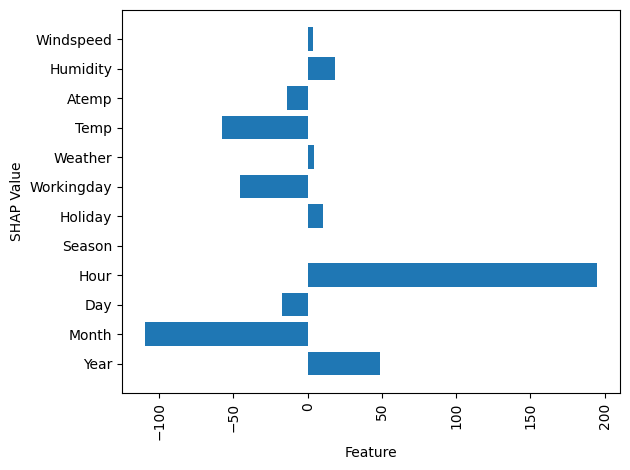

In [130]:
abs_shaps = np.abs(shap_values[:,1])
data = x_test.copy()
data["shaps"] = abs_shaps
mask = data["shaps"] == abs_shaps.max()
shap_value = shap_values[mask]
plt.barh(features, shap_value[0])
plt.xticks(rotation=90)
plt.xlabel("Feature")
plt.ylabel("SHAP Value")
plt.tight_layout()
plt.show()

In [131]:
interesting = "Month"
f_idx = features.index(interesting)

# shap_values shape: (n_samples, n_features)
abs_shap = np.abs(shap_values[:, f_idx])

# Get top indices and values
top_idx = np.argsort(abs_shap)[::-1][:10]
print("Top samples with high SHAP for", interesting, ":", top_idx)
print("SHAP values:", shap_values[top_idx, f_idx])

Top samples with high SHAP for Month : [ 438  350  450  691  739 1031  632  102  889  207]
SHAP values: [-109.90367082 -108.39781203  -96.35060609  -92.10089433  -91.0537993
  -91.00831357  -89.62079251  -89.32623015  -89.26161702  -86.96696018]


In [132]:
shap.initjs()
index = top_idx[0].item()
shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

# Homework 4:

In [ ]:
import sys
sys.path.append('/content')


In [134]:
# pip install transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers import ViTImageProcessor, ViTForImageClassification
import torch
import torch.nn.functional as F
import shap

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

from utils import tokenize_input, plot_attention_weights, get_model_pred
#from grad_sam import grad_sam
#from shap_values import shap_values
from tcav import select_concept_images, sample_images, get_vit_dataloader, flatten, get_activations, get_grads, train_cav, tcav

ModuleNotFoundError: No module named 'utils'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device {device}")

seed = 1337
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

Using device cpu


In [ ]:
# Use BERT trained on the SST-2 dataset (for binary classification)
tokenizer = AutoTokenizer.from_pretrained("textattack/bert-base-uncased-SST-2")
model = AutoModelForSequenceClassification.from_pretrained("textattack/bert-base-uncased-SST-2",attn_implementation="eager").to(device)
model.eval()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/477 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

## Grad-SAM

In [ ]:
def display_token_importance(tokens, importance):
    sorted_ = sorted(list(zip(tokens, importance)), key=lambda x: x[1], reverse=True)

    for i, (token, value) in enumerate(sorted_, start=1):
        print(f"{i}. '{token}': {value:.8f}")

def plot_token_importance(tokens, scores, title="Token importance (Grad-CAM)"):
    scores = scores - scores.min()
    if scores.max() > 0:
        scores = scores / scores.max()

    fig, ax = plt.subplots(figsize=(len(tokens) * 0.7, 2))

    ax.imshow(scores[np.newaxis, :], aspect="auto", cmap="Reds")
    ax.set_xticks(np.arange(len(tokens)))
    ax.set_xticklabels(tokens, rotation=45, ha="right")
    ax.set_yticks([])
    ax.set_title(title)

    plt.tight_layout()
    plt.show()

In [ ]:
def get_grads_gradsam(model, attentions, logits):
    """Return the gradient of the output with respect to the attention weights for all heads in all layers."""

    n_layers = model.config.num_hidden_layers

    pred = get_model_pred(logits)
    logits = logits.squeeze()

    attention_grads = {layer_idx : None for layer_idx in range(n_layers)}

    # Retain gradients for attention matrices
    for att in attentions:
        att.retain_grad()

    model.zero_grad()

    # Backward from the model prediction
    logits[pred].backward(retain_graph=True)

    # Collect gradients for each layer
    for layer_idx, att in enumerate(attentions):
        grad = att.grad.squeeze().clone() # Shape (n_heads, seq_len, seq_len)
        attention_grads[layer_idx] = grad

    return attention_grads

### Homework: Write the Grad-SAM function

In [ ]:
def grad_sam(model, attentions, logits):
    """Returns the Grad-SAM score for all tokens in an input sequence."""

    model = model.to(device)

    n_heads = model.config.num_attention_heads # number of attention heads
    n_layers = model.config.num_hidden_layers # number of hidden layers

    attention_grads = get_grads_gradsam(model, attentions, logits)

    # Assuming attentions are a tuple of tensors, each of shape (batch_size, num_heads, seq_len, seq_len)
    # We take the sequence length from the first attention layer's shape
    seq_len = attentions[0].shape[-1] # find sequence length from attentions, including CLS and SEP tokens are included

    layer_vectors = []

    for layer_idx, grad in attention_grads.items():
        # Take the relu of the gradient to focus on positive contributions
        relu_grad = torch.relu(grad) # Shape (n_heads, seq_len, seq_len)

        # Get attentions for the current layer, squeezing the batch dimension if present
        attention = attentions[layer_idx].squeeze(0) # Shape (n_heads, seq_len, seq_len)

        # Perform Hadamard product (element-wise multiplication) as per the Grad-SAM equation
        hadamard_product = relu_grad * attention # do the multiplication from the equation

        # Sum attention weights for each head (sum over columns corresponding to keys)
        # This sums across the last dimension (the 'to' tokens) to get importance for 'from' tokens
        summed_columns = hadamard_product.sum(dim=-1) # Shape (n_heads, seq_len)

        # Sum over all heads to get a single importance score for each token for the current layer
        summed_heads = summed_columns.sum(dim=0) # Shape (seq_len)

        # append summed_heads to the layer_vectors
        layer_vectors.append(summed_heads)

    # Sum over all layer vectors to get the final Grad-SAM scores
    grad_sam_scores = torch.stack(layer_vectors).sum(dim=0) # sum over the layer_vectors

    # Normalise scores to a 0-1 range (or similar, depending on desired normalization)
    # A common normalization is to scale by max value if all values are non-negative
    if grad_sam_scores.max() > 0:
        grad_sam_scores = grad_sam_scores / grad_sam_scores.max() # normalise
    else:
        grad_sam_scores = torch.zeros_like(grad_sam_scores)

    return grad_sam_scores

In [ ]:
def grad_sam(model, attentions, logits):
    """Returns the Grad-SAM score for all tokens in an input sequence."""

    model = model.to(device)

    n_heads = model.config. # number of attention heads
    n_layers = model.config. # number of hidden layers

    attention_grads = get_grads_gradsam(model, attentions, logits)

    seq_len = # find sequence length from attentions, including CLS and SEP tokens are included

    layer_vectors = []

    for layer_idx, grad in attention_grads.items():
        relu_grad = # take the relu of the gradient # Shape (n_heads, seq_len, seq_len)

        attention = # get attentions for the layer # Shape (n_heads, seq_len, seq_len)

        hadamard_product = # do the multiplication from the equation

        summed_columns = # Sum attention weights for each head (sum over columns) # Shape (n_heads, seq_len)

        summed_heads = # Sum over all heads # Shape (seq_len)

        # append summed_heads to the layer_vectors

    grad_sam_scores = # sum over the layer_vectors
    grad_sam_scores = # normalise

    return grad_sam_scores

In [ ]:
sentences = ["I like the movie",
            "She hates the book",
            "This is so boring",
            "I cannot wait for next time",
            "You look extremely confused"
            ]

for sentence in sentences:
    # Return the tokenizer output for the input sentence, which includes the tokenized sentences with
    # added CLS and SEP tokens and the attention masks
    input = tokenize_input(tokenizer, sentence).to(device)
    output = model(**input, output_attentions=True) # Forward pass
    logits = output.logits
    pred = get_model_pred(logits)

    # Get attention matrices for all heads and layers
    attentions = output.attentions
    # attentions is a tuple with tensor elements of shape
    # (batch size, num attention heads, sequence length, sequence length),
    # one tensor per layer (i.e., encoder block)
    print(f"The sentiment of '{sentence}' is {pred}")

The sentiment of 'I like the movie' is 1
The sentiment of 'She hates the book' is 0
The sentiment of 'This is so boring' is 0
The sentiment of 'I cannot wait for next time' is 1
The sentiment of 'You look extremely confused' is 0


In [ ]:
grad_sam_scores = grad_sam(model, attentions, logits).detach().cpu().numpy()

In [ ]:
tokens = tokenizer.convert_ids_to_tokens(input["input_ids"][0])
display_token_importance(tokens, grad_sam_scores)

1. '[CLS]': 1.00000000
2. 'confused': 0.80636013
3. 'you': 0.54531872
4. 'look': 0.51877367
5. 'extremely': 0.39516994
6. '[SEP]': 0.13060167


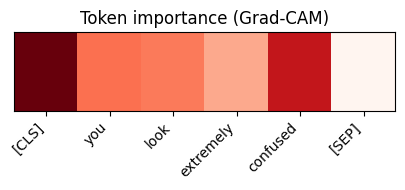

In [ ]:
plot_token_importance(tokens, grad_sam_scores)

## SHAP

In [ ]:
"""Implementation following https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/text.html"""

def f(x):
    # Tokenize all strings in input
    tv = torch.tensor([tokenizer(v, truncation=True,
                                 max_length=tokenizer.model_max_length,
                                 padding="max_length")["input_ids"] for v in x], device=device)

    # Fix padding stuff when input consist of several sentences
    attention_masks = torch.tensor([tokenizer(v, truncation=True, max_length=tokenizer.model_max_length,
                                              padding="max_length")["attention_mask"] for v in x], device=device)

    # Get model prediction (logits) and return the positive class
    outputs = model(input_ids=tv, attention_mask=attention_masks)[0].detach().cpu().numpy()

    return np.array(outputs[:,1]) # Positive class logits

Attention masks isn't necessary when the input is one sentence.

When the input contains several sentences of different lengst, padding tokens must be added.

Attention masks masks out padding tokens when calculating attention scores, so that only the actual input sentence is used.

In [ ]:
f(sentences)

array([ 3.6635602, -3.145779 , -3.4217703,  2.665551 , -2.903021 ],
      dtype=float32)

In [ ]:
explainer = shap.Explainer(f, tokenizer)
shap_values = explainer(sentences, fixed_context=1)

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [00:48<00:24, 12.19s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [01:08<00:15, 15.49s/it]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [01:37<00:00, 20.60s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [01:57, 23.57s/it]


In [ ]:
shap_values

.values =
array([array([-0.12959369,  0.5697345 ,  2.80113624, -0.14384766,  0.32744562,
               0.17642224])                                                   ,
       array([ 0.04401791,  0.04553521, -3.53780533, -0.05805473,  0.00513335,
               0.29313202])                                                   ,
       array([ 0.30843858,  0.25726203,  0.28962771,  0.28991643, -4.94576707,
               0.31648932])                                                   ,
       array([-0.10001777,  0.30019118,  1.070114  ,  1.28322409,  0.11099617,
               0.42984835,  0.22122888, -0.22297736])                         ,
       array([ 0.59630467,  0.48589803,  0.2785715 , -0.05426274, -4.83737086,
               0.56557562])                                                   ],
      dtype=object)

.base_values =
array([ 0.06226267,  0.06226267,  0.06226267, -0.42705658,  0.06226267])

.data =
(array(['', 'I ', 'like ', 'the ', 'movie', ''], dtype=object), array(['', '

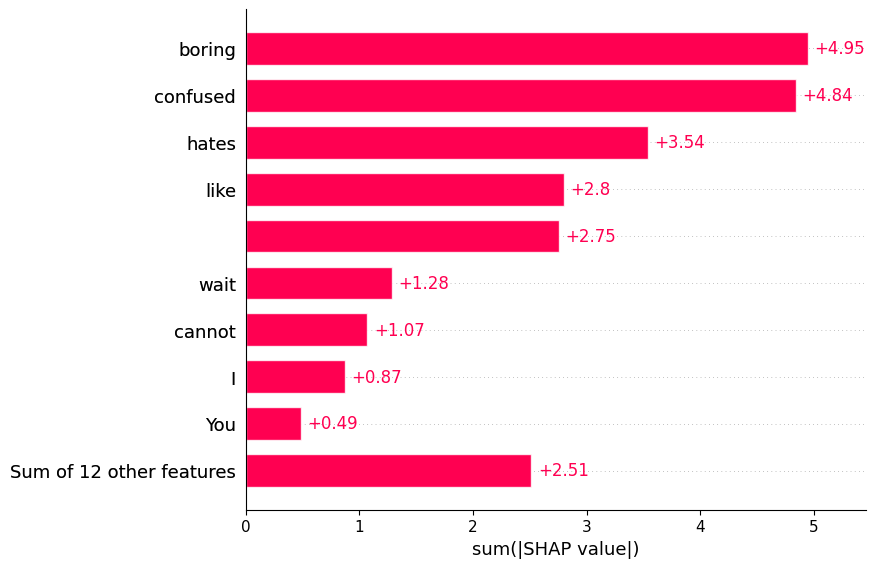

In [ ]:
shap.plots.bar(shap_values.abs.sum(0))

In [ ]:
i = 3
shap.plots.initjs()
shap.plots.text(shap_values[i])

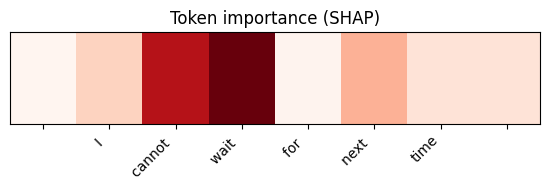

In [ ]:
plot_token_importance(shap_values[i].data, np.abs(shap_values[i].values), title="Token importance (SHAP)")

## SHAP

In [ ]:
"""Implementation following https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/text.html"""

def f(x):
    # Tokenize all strings in input
    tv = torch.tensor([tokenizer(v, truncation=True,
                                 max_length=tokenizer.model_max_length,
                                 padding="max_length")["input_ids"] for v in x], device=device)

    # Fix padding stuff when input consist of several sentences
    attention_masks = torch.tensor([tokenizer(v, truncation=True, max_length=tokenizer.model_max_length,
                                              padding="max_length")["attention_mask"] for v in x], device=device)

    # Get model prediction (logits) and return the positive class
    outputs = model(input_ids=tv, attention_mask=attention_masks)[0].detach().cpu().numpy()

    return np.array(outputs[:,1]) # Positive class logits

Attention masks isn't necessary when the input is one sentence.

When the input contains several sentences of different lengst, padding tokens must be added.

Attention masks masks out padding tokens when calculating attention scores, so that only the actual input sentence is used.

In [ ]:
f(sentences)

array([ 3.6635602, -3.145779 , -3.4217703,  2.665551 , -2.903021 ],
      dtype=float32)

In [ ]:
explainer = shap.Explainer(f, tokenizer)
shap_values = explainer(sentences, fixed_context=1)

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [00:48<00:24, 12.19s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [01:08<00:15, 15.49s/it]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [01:37<00:00, 20.60s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [01:57, 23.57s/it]


In [ ]:
shap_values

.values =
array([array([-0.12959369,  0.5697345 ,  2.80113624, -0.14384766,  0.32744562,
               0.17642224])                                                   ,
       array([ 0.04401791,  0.04553521, -3.53780533, -0.05805473,  0.00513335,
               0.29313202])                                                   ,
       array([ 0.30843858,  0.25726203,  0.28962771,  0.28991643, -4.94576707,
               0.31648932])                                                   ,
       array([-0.10001777,  0.30019118,  1.070114  ,  1.28322409,  0.11099617,
               0.42984835,  0.22122888, -0.22297736])                         ,
       array([ 0.59630467,  0.48589803,  0.2785715 , -0.05426274, -4.83737086,
               0.56557562])                                                   ],
      dtype=object)

.base_values =
array([ 0.06226267,  0.06226267,  0.06226267, -0.42705658,  0.06226267])

.data =
(array(['', 'I ', 'like ', 'the ', 'movie', ''], dtype=object), array(['', '

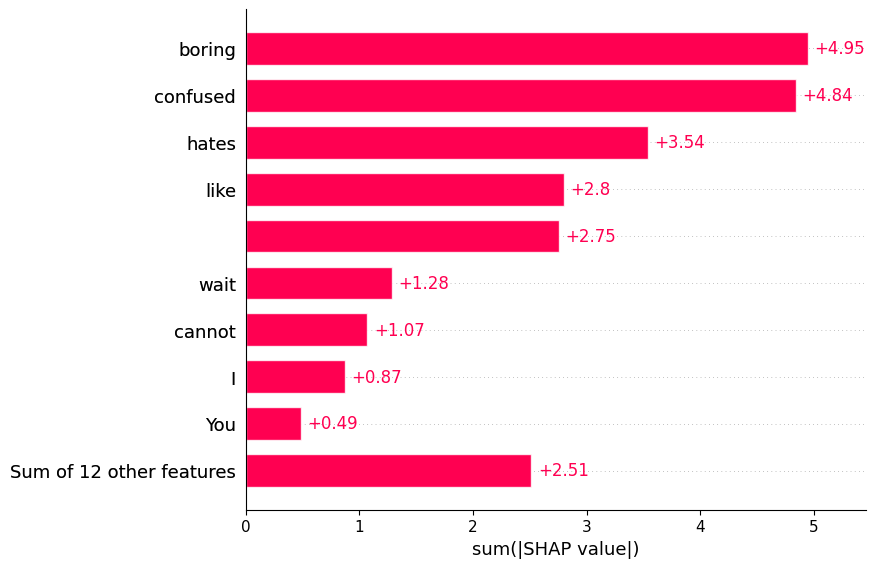

In [ ]:
shap.plots.bar(shap_values.abs.sum(0))

In [ ]:
i = 3
shap.plots.initjs()
shap.plots.text(shap_values[i])

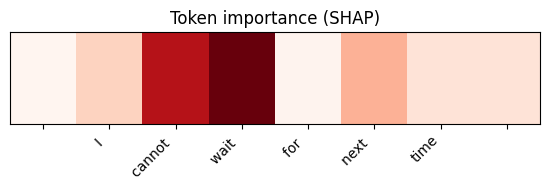

In [ ]:
plot_token_importance(shap_values[i].data, np.abs(shap_values[i].values), title="Token importance (SHAP)")

## TCAV score

In [136]:
batch_size = 16
num_concept_images = 100
num_target_images = 20
target_class = "zebra"
positive_concept = "striped"
negative_concept = "dotted"

In [ ]:
# Get the absolute path to concept and target images
base_dir = os.getcwd()
concept_folder = "../data/broden/dtd"
target_folder = os.path.join("../data/imagenet", target_class)

p_concept_paths = select_concept_images(folder_path=concept_folder, concept=positive_concept, n=num_concept_images)
n_concept_paths = select_concept_images(folder_path=concept_folder, concept=negative_concept, n=num_concept_images)

target_paths = sample_images(folder_path=target_folder, n=num_target_images)

In [135]:
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
vit = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224').to(device)
vit.eval()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

In [137]:
label2id = vit.config.label2id
class_idx = label2id.get(target_class)

In [ ]:
positive_loader = get_vit_dataloader(p_concept_paths, processor, batch_size=batch_size)
negative_loader = get_vit_dataloader(n_concept_paths, processor, batch_size=batch_size)
target_loader = get_vit_dataloader(target_paths, processor, batch_size=batch_size)

In [ ]:
layer = vit.vit.encoder.layer[10]

In [ ]:
positive_activations = flatten(get_activations(vit, positive_loader, device, layer))
negative_activations = flatten(get_activations(vit, negative_loader, device, layer))

In [ ]:
cav = train_cav(positive_activations, negative_activations)

In [ ]:
grads = flatten(get_grads(vit, target_loader, device, layer, target_idx=class_idx))
tcav_score = tcav(cav, grads)
print(f"TCAV score: {tcav_score}")

TCAV score: 0.95


## Attention weights

In [ ]:
sentence = "I like the movie."

input = tokenize_input(tokenizer, sentence).to(device) # Return the tokenizer output for the input sentence, which includes the tokenized sentences with added CLS and SEP tokens and the attention masks
output = model(**input, output_attentions=True) # Forward pass
logits = output.logits

# Get attention matrices for all heads and layers
attentions = output.attentions # Tuple with tensor elements of shape (batch size, num attention heads, sequence length, sequence length), one tensor per layer (i.e., encoder block)


In [ ]:
tokens = tokenizer.convert_ids_to_tokens(input["input_ids"][0])

In [ ]:
def plot_attention(attention, tokens, title):
    plt.figure(figsize=(6, 5))
    plt.imshow(attention, cmap="viridis")
    plt.xticks(range(len(tokens)), tokens, rotation=45, ha="right")
    plt.yticks(range(len(tokens)), tokens)
    plt.colorbar()
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Choose head 0
head_idx = 0

# Layer 2 (early)
layer_early = 2
att_early = attentions[layer_early][0, head_idx].detach().cpu()
plot_attention(att_early, tokens, f"Attention Head {head_idx}, Layer {layer_early}")

# Layer 10 (late)
layer_late = 10
att_late = attentions[layer_late][0, head_idx].detach().cpu()
plot_attention(att_late, tokens, f"Attention Head {head_idx}, Layer {layer_late}")


# Homework 5:

In [3]:
import os

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image, ImageOps
from torchvision import models, transforms

### Load model

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
model.to(device)
model.eval()

print(model)

Using device: cpu
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 107MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Setup transforms and example image

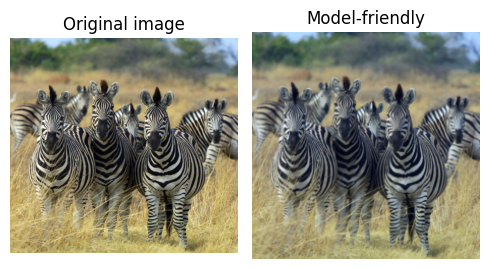

In [5]:
# Load your image here
image_path = "/content/Zebra_test.JPEG"
image = Image.open(image_path)
image = ImageOps.exif_transpose(image) # Potentially flip image if it was taken in portrait mode

transform_human = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# For model input: resize, divides by 255, then normalize with ImageNet statistics
transform_model = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
image_human = transform_human(image)
image_model = transform_model(image)

# Min-max normalize to [0,1]. Do not give this to the model! Just for plotting
image_model_normalized = (image_model - image_model.min()) / (image_model.max() - image_model.min())

fig, axs = plt.subplots(1, 2, figsize=(5, 8))
axs[0].imshow(image)
axs[0].axis("off")
axs[0].set_title("Original image")
axs[1].imshow(image_model_normalized.permute(1, 2, 0))
axs[1].axis("off")
axs[1].set_title("Model-friendly")
plt.tight_layout()
plt.show()

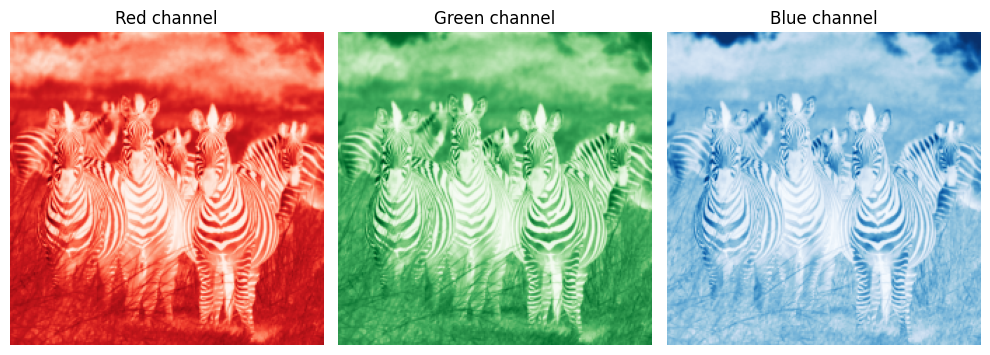

In [6]:
# Plot RGB channels of image_model
Colors = {"Red": "Reds", "Green": "Greens", "Blue": "Blues"}
fig, axs = plt.subplots(1, 3, figsize=(10, 5))
for i, channel in enumerate(("Red", "Green", "Blue")):
    axs[i].imshow(image_model[i], cmap=Colors[channel])
    axs[i].axis("off")
    axs[i].set_title(f"{channel} channel")
plt.tight_layout()
plt.show()

### First convolutional layer

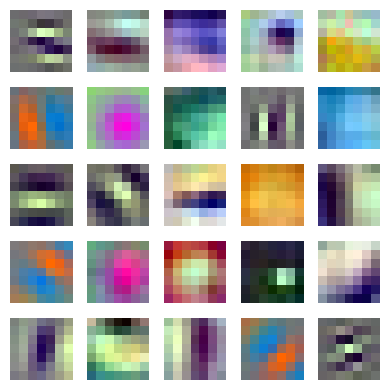

In [7]:
fig, axs = plt.subplots(5, 5, figsize=(4, 4))
for i, ax in enumerate(axs.flat):
    weights = model.conv1.weight[i].cpu().detach().numpy().transpose(1, 2, 0)
    weights = (weights - weights.min()) / (weights.max() - weights.min())
    ax.imshow(weights)
    ax.axis("off")
plt.tight_layout()
plt.show()

### Horizontal line detector (Gabor filter)

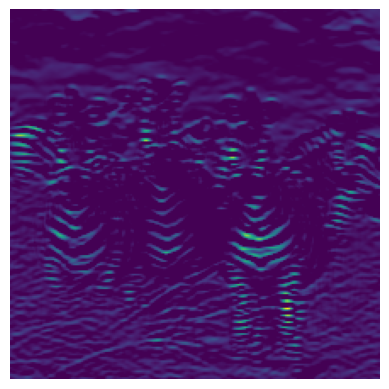

In [8]:
# Extract filter #11 (first in third row)
filter_weights = model.conv1.weight[10].cpu().detach().unsqueeze(0) # shape: (1, 3, 7, 7)

# Add batch dimension to the image: (1, 3, 224, 224)
image_batch = image_model.unsqueeze(0)

# Apply convolution and ReLU
filtered_image = F.relu(F.conv2d(image_batch, filter_weights))
filtered_image = filtered_image.squeeze(0).squeeze(0)

plt.imshow(filtered_image)
plt.axis("off")
plt.show()

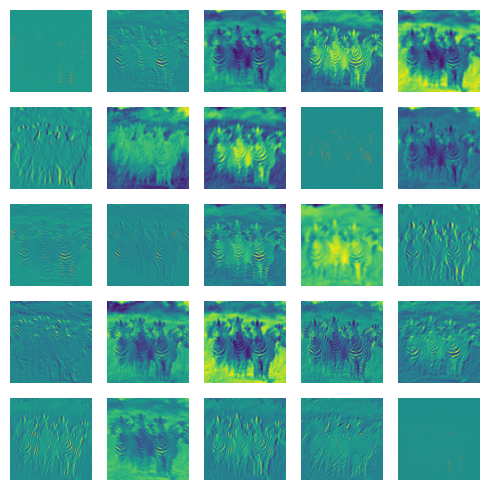

In [9]:
# Apply first 25 filters
weights = model.conv1.weight[:25].cpu().detach() # (25, 3, 7, 7)
feature_maps = F.conv2d(image_batch, weights).squeeze(0) # (25, H', W')

# Plot feature maps
fig, axs = plt.subplots(5, 5, figsize=(5, 5))
for i, ax in enumerate(axs.flat):
    feature_map = feature_maps[i].cpu().detach().numpy()
    ax.imshow(feature_map)
    ax.axis("off")
plt.tight_layout()
plt.show()

### Later layers are not interpretable

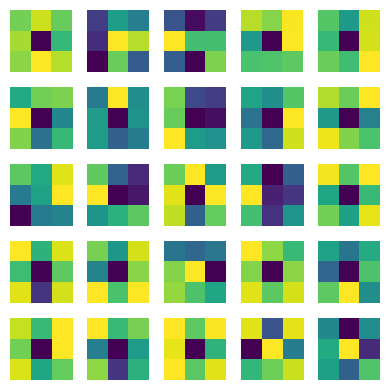

In [10]:
fig, axs = plt.subplots(5, 5, figsize=(4, 4))
for i, ax in enumerate(axs.flat):
    # Extract the filters in the second convolutional layer
    weights = model.layer1[0].conv1.weight[i].cpu().detach().numpy()
    weights = weights.mean(axis=0) # (64x3x3) -> (3x3)
    weights = (weights - weights.min()) / (weights.max() - weights.min())

    ax.imshow(weights, cmap='viridis')
    ax.axis("off")
plt.tight_layout()
plt.show()

### Visualize feature maps in later layers

In [11]:
output_feature_maps = {}
def forward_hook(module, input, output):
    output_feature_maps[module] = output

# Add hooks to conv layers
hooks = []
for layer in model.modules():
    if isinstance(layer, torch.nn.Conv2d): # Ignoring BatchNorm, Pooling, FC layer, ReLU
        hooks.append(layer.register_forward_hook(forward_hook))

# Forward the image to collect feature maps
with torch.no_grad():
    output = model(image_batch.to(device))

for hook in hooks:
    hook.remove()

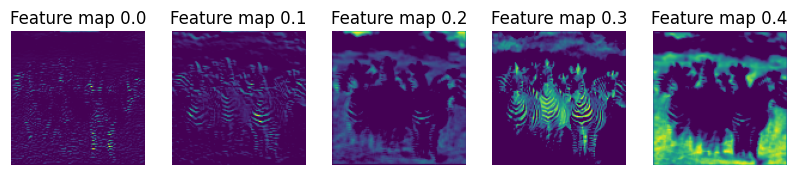

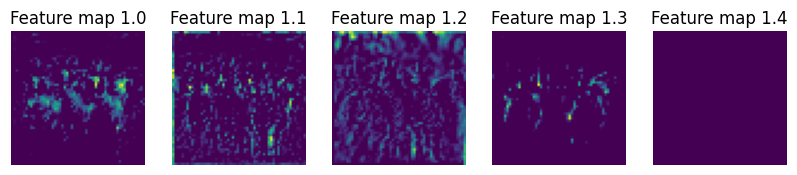

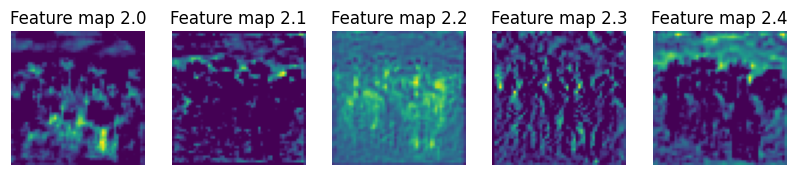

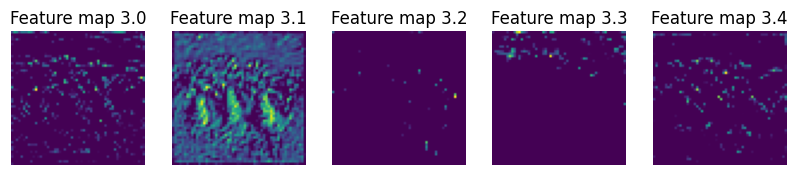

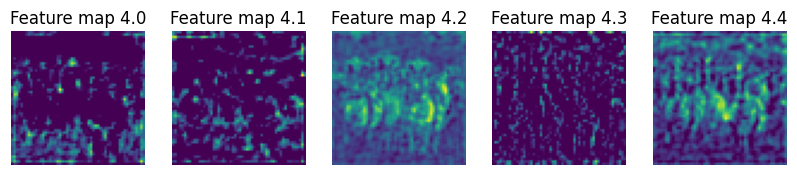

...

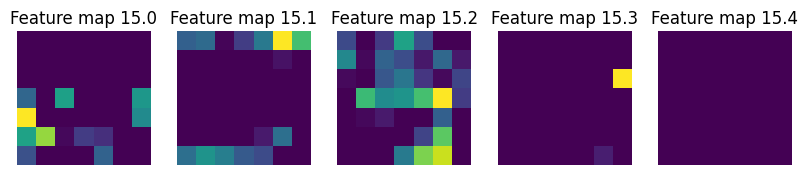

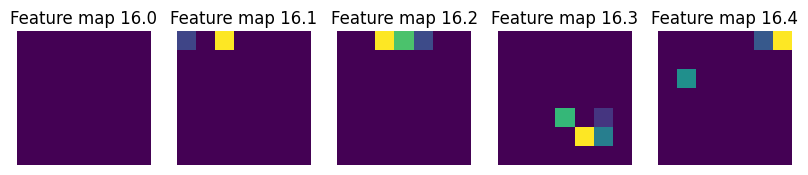

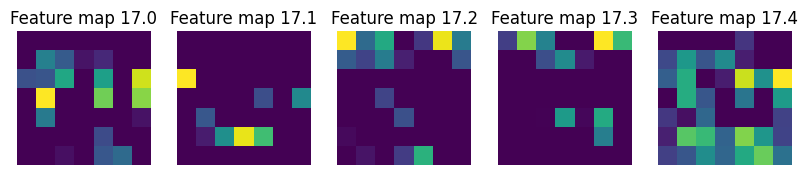

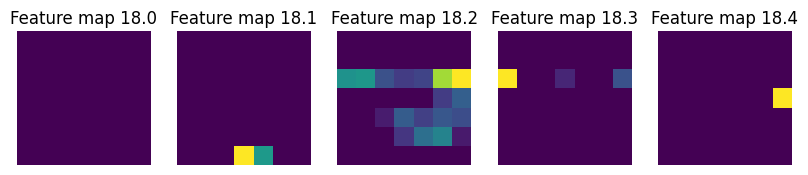

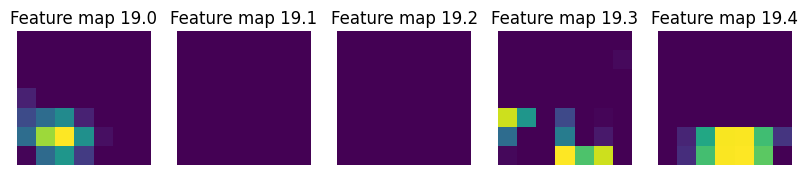

In [12]:
# Plot 5 feature maps for each layer
for i, (layer, feature_map) in enumerate(output_feature_maps.items()):
    fig, axs = plt.subplots(1, 5, figsize=(10, 5))
    for j in range(5):
        feature_map_j = F.relu(feature_map[0][j]).squeeze().cpu().detach().numpy()
        axs[j].imshow(feature_map_j)
        axs[j].axis("off")
        axs[j].set_title(f"Feature map {i}.{j}")
    plt.show()

### Filter 14.1 looks interesting, maybe it is zebra-related?

### OPTIONAL: Download Broden dataset from https://github.com/CSAILVision/NetDissect
Only do this if you're on a computer with 1-2 GB to spare!

1. git clone https://github.com/CSAILVision/NetDissect.git
2. cd NetDissect
3. script/dlbroden_227.sh

In [ ]:
# Add hook to target layer
outputs = []
def forward_hook(module, input, output):
    outputs.append(output)

conv_idx = 14
filter_idx = 1
# option 1: reference target layer by index
#hook = list(output_feature_maps.keys())[conv_idx].register_forward_hook(forward_hook)
# option 2: reference target layer by name
hook = model.layer3[1].conv2.register_forward_hook(forward_hook)

# Folder to load N images from.
valid_formats = {".jpg", ".jpeg", ".png"}
N = 500
# Decide which dataset to use. Different datasets give different results!
images_dir = "../data/broden/pascal"
ignore_types = ("color", "object", "part") # Ignore segmentation maps in Broden
files = [f for f in os.listdir(images_dir) if os.path.splitext(f)[1].lower() in valid_formats and not any(ignore_type in f for ignore_type in ignore_types)]
images = torch.stack([transform_model(Image.open(os.path.join(images_dir, f))) for f in files[:N]]).to(device)

# Forward images, collect outputs and remove hook
outputs = []
with torch.no_grad():
    model(images)
hook.remove()

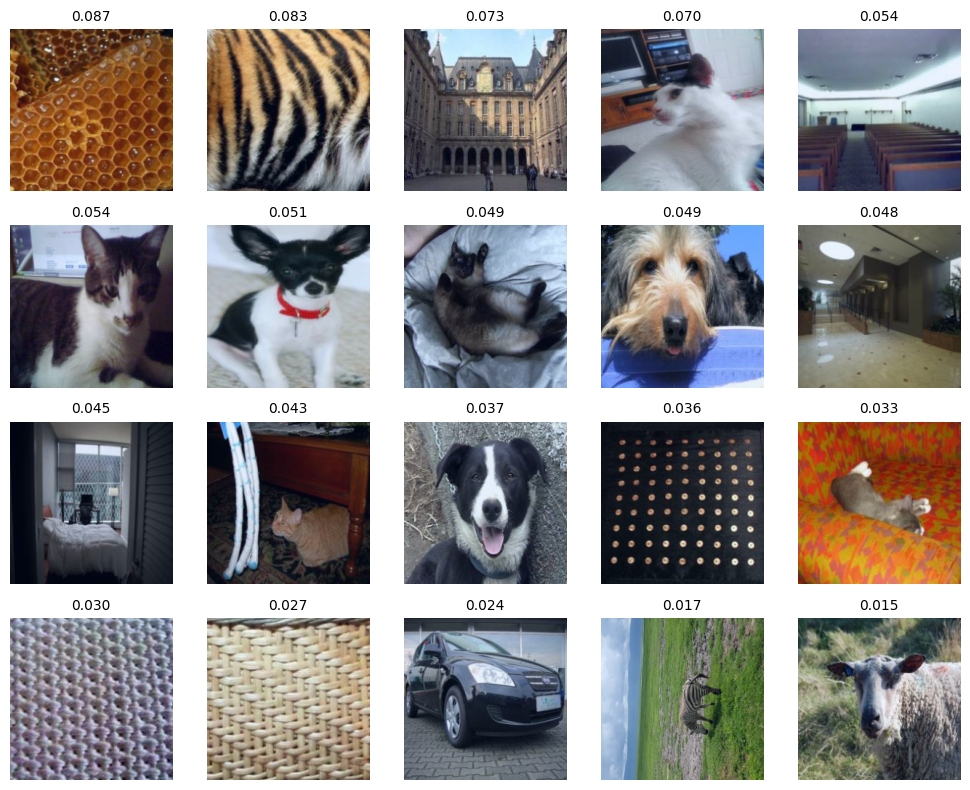

In [ ]:
# Get feature maps of the target filter
feature_maps = outputs[0][:, filter_idx, :, :]
# Apply ReLU
feature_maps = F.relu(feature_maps)
# Aggregate to single score per image
scores = feature_maps.mean(dim=(1, 2))
# Sort images by the score: Mean activation of a feature map (post-ReLU)
sorted_indices = torch.argsort(scores, descending=True)

# Determine number of images to plot
cols = 5
rows = 4
num_images = min(cols*rows, len(images))
fig, axs = plt.subplots(rows, cols, figsize=(2*cols, 2*rows))
# Plot most activating images
for i, ax in enumerate(axs.flat):
    if i >= num_images:
        ax.axis("off")
        continue

    image = images[sorted_indices[i]].permute(1, 2, 0)
    image = (image - image.min()) / (image.max() - image.min())
    ax.imshow(image.cpu().numpy())

    score_value = scores[sorted_indices[i]].detach().cpu().item()
    ax.set_title(f"{score_value:.3f}", fontsize=10)
    ax.axis("off")
plt.tight_layout()
plt.show()

### Activation maximization

Iteration 0, score: 0.004
Iteration 50, score: 0.610
Iteration 100, score: 1.051
Iteration 150, score: 1.194
Iteration 200, score: 1.231
Iteration 250, score: 1.241
Iteration 300, score: 1.252
Iteration 350, score: 1.271
Iteration 400, score: 1.284
Iteration 450, score: 1.294


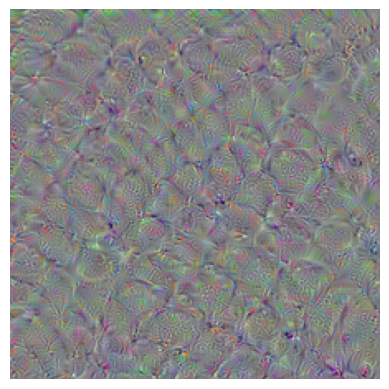

In [ ]:
# We optimize this X such that the activation "score" is maximized
X = torch.randn(1, 3, 224, 224).to(device)
X.requires_grad = True

# Add hook to target layer
hook = list(output_feature_maps.keys())[conv_idx].register_forward_hook(forward_hook)

iterations = 500
optimizer = torch.optim.Adam([X], lr=0.01)
for i in range(iterations):
    # Forward pass
    outputs.clear()
    _ = model(X)
    # Calculate score
    score = outputs[0][0, filter_idx, :, :]
    score = F.relu(score).mean()
    # Calculate loss
    loss = -score
    reg_loss = 0.01 * torch.norm(X, p=2) # L2 regularization
    loss = loss + reg_loss
    # Backward gradients and update X
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    if i % 50 == 0:
        print(f"Iteration {i}, score: {score.mean().item():.3f}")
hook.remove()

# Plot the generated image
generated_image = X.squeeze().cpu().detach().numpy().transpose(1, 2, 0)
generated_image = (generated_image - generated_image.min()) / (generated_image.max() - generated_image.min())
plt.imshow(generated_image)
plt.axis("off")
plt.show()

100%|██████████| 512/512 [00:04<00:00, 124.81it/s]


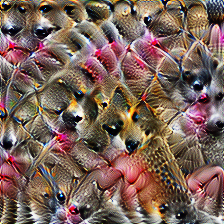

In [ ]:
# !pip install torch-lucent

# Activation maximization with lucent
import lucent.optvis.objectives as objectives
import lucent.optvis.param as param
import lucent.optvis.render as render

size = 224
objective = objectives.channel(layer="layer3_1_conv2", n_channel=filter_idx) # Must reference layer by name
param_f = lambda: param.image(size)

_ = render.render_vis(model.to(device), objective, param_f=param_f, thresholds=(512,), fixed_image_size=(size, size), show_image=True)[0]